# Сборный проект - 2: "Восстановление золота из руды"

<h1>Содержание<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Подготовка-данных" data-toc-modified-id="Подготовка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Подготовка данных</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Модель" data-toc-modified-id="Модель-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Модель</a></span></li><li><span><a href="#Чек-лист-готовности-проекта" data-toc-modified-id="Чек-лист-готовности-проекта-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Чек-лист готовности проекта</a></span></li></ul></div>

## 1. Описание проекта. План работы.

Для золотодобывающего горно-обогатительного комбината (ГОК) требуется улучшить производственный процесс, чтобы снизить издержки.  Построим модель машинного обучения, которая поможет оптимизировать процесс обогащения золота в золотосодержацих рудах.

Нам предоставлены данные с параметрами добычи руды и многоступенчатой очистки золота.

Шаги для выполнения проекта:
1. Подготовить данные.
2. Провести исследовательский анализ данных.
3. Построить и обучить модель.


### 1.1. Схема технологического процесса.
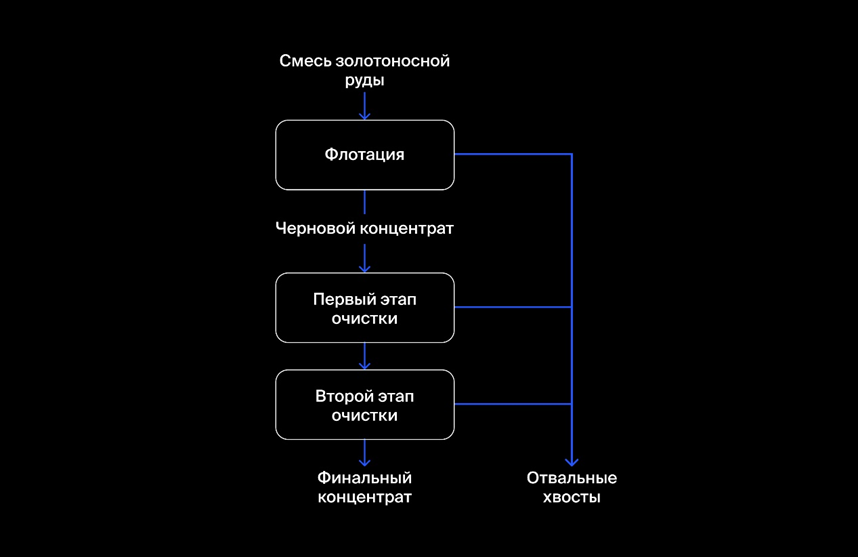

Когда добытая руда проходит первичную обработку, получается дроблёная смесь. Её отправляют на флотацию (обогащение) и двухэтапную очистку. Опишем каждую стадию:

1.**Флотация**.

Во флотационную установку подаётся смесь золотосодержащей руды. После обогащения получается черновой концентрат и «отвальные хвосты», то есть остатки продукта с низкой концентрацией ценных металлов. *На стабильность этого процесса влияет непостоянное и неоптимальное физико-химическое состояние флотационной пульпы (смеси твёрдых частиц и жидкости)*.

2.**Очистка**.

Черновой концентрат проходит две очистки. На выходе получается финальный концентрат и новые отвальные хвосты.


### 1.2 Обозначения, применяемые в техпроцессе.
* Rougher feed — исходное сырье
* Rougher additions (или reagent additions) — флотационные реагенты: Xanthate, Sulphate, Depressant 
    *  Xanthate **— ксантогенат (промотер, или активатор флотации);
    *  Sulphate — сульфат (на данном производстве сульфид натрия);
    *  Depressant — депрессант (силикат натрия).
* Rougher process (англ. «грубый процесс») — флотация
* Rougher tails — отвальные хвосты
* Float banks — флотационная установка
* Cleaner process — очистка
* Rougher Au — черновой концентрат золота
* Final Au — финальный концентрат золота

**Параметры этапов:**
* air amount — объём воздуха
* fluid levels — уровень жидкости
* feed size — размер гранул сырья
* feed rate — скорость подачи


### 1.3. Вводная информация.

Данные геологоразведки трёх регионов находятся в файлах: 
* gold_recovery_train_new.csv
* gold_recovery_test_new.csv
* gold_recovery_full_new.csv

Данные индексируются датой и временем получения информации (признак *date*). **Соседние по времени параметры часто похожи**.

Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже. Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей. Также в тестовом наборе нет целевых признаков.

Исходный датасет содержит обучающую и тестовую выборки со всеми признаками.

В нашем распоряжении сырые данные: их просто выгрузили из хранилища. Прежде чем приступить к построению модели, проверьте по нашей инструкции их на корректность.


### 1.4. Цель проекта.

Подготовить прототип модели машинного обучения для компании «Цифра». 

Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды и поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

Для прогноза коэффициента нужно **найти долю золота в концентратах и хвостах.** Причём важен не только финальный продукт, но и черновой концентрат.


### 1.5. Задачи проекта.

**1.Подготовить данные:**

1.1. Открыть файлы:
* **gold_recovery_train_new.csv**,
* **gold_recovery_test_new.csv**,
* **gold_recovery_full_new.csv**.

и изучить их.

1.2. Проверить, что эффективность обогащения рассчитана правильно. Вычислить её на обучающей выборке для признака **rougher.output.recovery**. Найти MAE между нашими расчётами и значением признака. Описать выводы.

Смоделировать процесс восстановления золота из золотосодержащей руды. Эффективность обогащения рассчитывается по формуле:

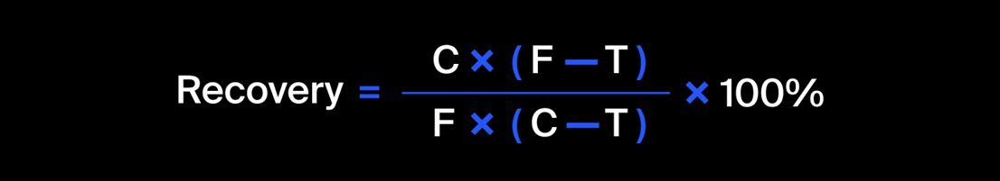 

где:
* **C** — доля золота в концентрате после флотации/очистки (**'Сoncentrate'**);
* **F** — доля золота в сырье/концентрате до флотации/очистки (**'Float'**); 
* **T** — доля золота в отвальных хвостах после флотации/очистки (**'Tail'**).

1.3. Проанализировать признаки, недоступные в тестовой выборке. Что это за параметры? К какому типу относятся?

1.4. Провести предобработку данных.

**2. Проанализировать данные:**

2.1. Посмотреть, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. Описать выводы.

2.2. Сравнить распределения размеров гранул сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.

2.3. Исследовать суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. 

**3. Построить модель:**

3.1. Написать функцию для вычисления итоговой sMAPE.

3.2. Обучить разные модели и оценить их качество кросс-валидацией. Выбрать лучшую модель и проверить её на тестовой выборке. Описать выводы.


### 1.6. Наименование признаков.
Наименование признаков должно быть такое:

[этап].[тип_параметра].[название_параметра]
Пример: rougher.input.feed_ag
Возможные значения для блока [этап]:
* rougher — флотация
* primary_cleaner — первичная очистка
* secondary_cleaner — вторичная очистка
* final — финальные характеристики

Возможные значения для блока [тип_параметра]:
* input — параметры сырья
* output — параметры продукта
* state — параметры, характеризующие текущее состояние этапа
* calculation — расчётные характеристики

Целевой признак:
* final.calculation.concentrate_au  — итоговые рассчитанные содержания золота в концентрате.


### 1.7. Проверяемые гипотезы.

**Нужно спрогнозировать сразу две величины**:

1. Эффективность обогащения чернового концентрата **rougher.output.recovery**.

2. Эффективность обогащения финального концентрата **final.output.recovery**.

Итоговая метрика складывается из двух величин:

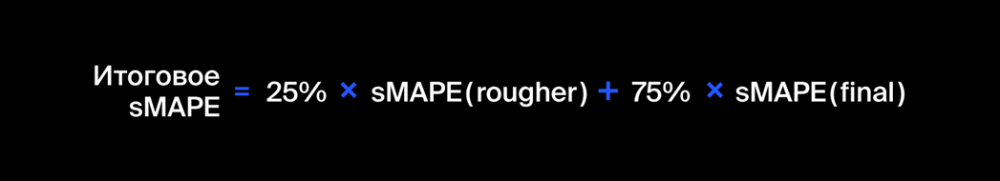


### 1.8. Метрика качества.

Для решения задачи введём новую метрику качества — sMAPE (англ. Symmetric Mean Absolute Percentage Error, «симметричное среднее абсолютное процентное отклонение»).

Она похожа на MAE, но выражается не в абсолютных величинах, а в относительных. Почему симметричная? Она одинаково учитывает масштаб и целевого признака, и предсказания.

Метрика sMAPE вычисляется так:

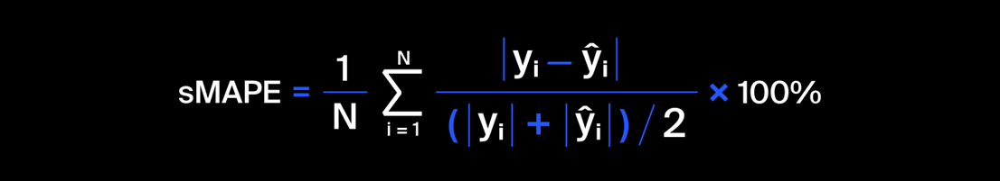


In [1]:
#!pip install skimpy
#!pip install pyod

In [51]:
# Все import соберем в начале проекта:
import warnings
warnings.filterwarnings('ignore')

import matplotlib
%matplotlib inline

import pandas as pd
import seaborn as sns
import numpy as np
from scipy import stats as st
from skimpy import skim

import matplotlib.pyplot as plt
from numpy.random import RandomState
from tqdm.auto import tqdm

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression 
from sklearn.metrics import mean_squared_error, make_scorer, \
                            mean_absolute_error
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.dummy import DummyRegressor


RANDOM_FIX_NUMBER = 12345  # Введем глобальную переменную для значения random_state
STATE = np.random.RandomState(RANDOM_FIX_NUMBER)
NUM_CIRCLE_BOOTATRAP = 1000 


# Не ограничиваем максимальное количество отображающихся столбцов
pd.set_option('display.max_columns', None) 
# Сброс ограничений на количество выводимых рядов
pd.set_option('display.max_rows', None)
# Сброс ограничений на количество символов в записи
pd.set_option('display.max_colwidth', None)

# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой;
pd.set_option('display.float_format', '{:.3f}'.format) 
# вернуть настройки к дефолтным:
# pd.reset_option('all')

%config InlineBackend.figure_format = 'svg'

# Создадим функцию для печати строки символов. 
# Так будем разделять информацию между различными датасетами.
def Separating_line():
    print('-' * 80)

## 2. Загрузка и подготовка данных

Задачи:

1.Открыть файлы: 
* gold_recovery_train_new.csv
* gold_recovery_test_new.csv
* gold_recovery_full_new.csv 
и изучить их.

2.Проверить, что эффективность обогащения рассчитана правильно. Вычислить её на обучающей выборке для признака ougher.output.recovery. Найти MAE между нашими расчётами и значением признака. Описать выводы.

3.Проанализировать признаки, недоступные в тестовой выборке. Что это за параметры? К какому типу относятся?

4.Провести предобработку данных.

### 2.1. Загрузка локального и удаленного файлов с данными:

Изучили файлы с предоставленными данными 
* **gold_recovery_full_new.csv'**, 
* **gold_recovery_train_new.csv'**, 
* **gold_recovery_test_new.csv'** 

и решили использовать символ **запятая** для разделения данных:

In [3]:
files_name = ['gold_recovery_full_new.csv', 'gold_recovery_train_new.csv', 'gold_recovery_test_new.csv']
data_names = ['full', 'train', 'test']
data = {}  # пустой словарь для датасетов

try:
    for n_file in range(len(files_name)):
        dataset_local_path = 'datasets/' + files_name[n_file]
        data[data_names[n_file]] = pd.read_csv(dataset_local_path, sep=',') 
    print('Local datasets is loaded successfully.')
except:
    for n_file in range(len(files_name)):
        dataset_remote_path = 'https://code.s3.yandex.net/datasets/' + files_name[n_file]
        data[data_names[n_file]] = pd.read_csv(dataset_remote_path, sep=',')      
    print('Remote datasets is loaded successfully.')

Local datasets is loaded successfully.


### 2.2. Изучим датасеты:

Посмотрим, **объем данных находящихся в изучаемых файлах** и сохраним размеры исходных датасетов в словарик для последующего использования.


In [4]:
initial_size = {}

for key_df in data:
    print("Размер датасета data '", key_df, "': ", data[key_df].shape, sep='', end=' ')
    print(f"= {data[key_df].size:_.0f}.")
   
    initial_size[key_df] = data[key_df].shape[0]

Размер датасета data 'full': (19439, 87) = 1_691_193.
Размер датасета data 'train': (14149, 87) = 1_230_963.
Размер датасета data 'test': (5290, 53) = 280_370.


Отметим:
1. Размер датасетов разный. 
2. Количество признаков в тестовой выборке на 87 - 53 = 34 признака меньше, чем в обучающей и некоей полной (full).
3. Суммарное количество объектов в обучающей и тестовой выборках (1 230 963 + 280 370 = 1 511 333) меньше, чем в полной выборке (1 691 193) на довольно большую величину: 179 860 объектов.
4. Набор данных довольно большой. В обучающей выборке 14 149 строк х 87 столбцов. В тестовой выборке 5 290 строк х 53 столбцов.

Как указано в задании: "Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже. Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей."

Хорошо. Отсутствие в тестовой выборке некоторых признаков понятно. Посмотрим их позднее.

Изучим, **какая информация содержится в столбцах:**

In [5]:
for key_df in data:
    print("\nИнформация по датасету data '", key_df, "':\n", data[key_df].sample(2))
    Separating_line()


Информация по датасету data ' full ':
                       date  final.output.concentrate_ag  \
11934  2017-08-11 20:59:59                        5.925   
5380   2016-10-09 17:59:59                        9.645   

       final.output.concentrate_pb  final.output.concentrate_sol  \
11934                       14.765                         6.664   
5380                         8.855                        11.993   

       final.output.concentrate_au  final.output.recovery  \
11934                       37.337                100.000   
5380                        38.343                 68.376   

       final.output.tail_ag  final.output.tail_pb  final.output.tail_sol  \
11934                 0.000                 0.000                  0.000   
5380                 11.227                 2.896                 10.449   

       final.output.tail_au  primary_cleaner.input.sulfate  \
11934                 0.000                            NaN   
5380                  4.346             

Видим, что:

1. Все признаки являются количественными. Категориальных признаков нет.

2. Названия столбцов соответствуют требованию задания: ([этап].[тип_параметра].[название_параметра]). Например: *rougher.input.feed_ag* и в коррекции не нуждаются.

3. Есть информация по содержаниям для трех химических элементов (Au, Ag, Pb). К сожалению, отсутствуют данные по наиболее важному элементу - Cu, который оказывает сильное влияние на флотацию и в концентрате его содержание доходит до 80%, создавая основу для золотосодержащих концентратов.

4. Значения содержания золота находятся в диапазоне от 1 (в 'хвостах') до 50 в итоговом концентрате. Видимо, эти цифры даны в граммах на тонну (г/т).

5. Еще одна количественная характеристика, sol (solvent) содержит информацию по концентрации растворителя.

**Поиск дубликатов:**

In [6]:
for key_df in data:
    print("Количество дублирующих строк в датасете data '", key_df, "':", data[key_df].duplicated().sum())

Количество дублирующих строк в датасете data ' full ': 0
Количество дублирующих строк в датасете data ' train ': 0
Количество дублирующих строк в датасете data ' test ': 0


Отлично! **Дубликатов в наших таблицах нет**.

Выведем **основную информацию с помощью метода info():**

In [7]:
for key_df in data:
    print("\nИнформация по датасету data '", key_df, "':\n")
    print(data[key_df].info())
    Separating_line()


Информация по датасету data ' full ':

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19439 entries, 0 to 19438
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                19439 non-null  object 
 1   final.output.concentrate_ag                         19438 non-null  float64
 2   final.output.concentrate_pb                         19438 non-null  float64
 3   final.output.concentrate_sol                        19228 non-null  float64
 4   final.output.concentrate_au                         19439 non-null  float64
 5   final.output.recovery                               19439 non-null  float64
 6   final.output.tail_ag                                19438 non-null  float64
 7   final.output.tail_pb                                19338 non-null  float64
 8   final.output.tail_sol               

Отмечаем:

1. Кроме объекта *date*, имеющего тип object, все остальные признаки типа float.
   При создании выборки для обучающей модели признак 'date' исключим.
2. В каждом датасете много признаков с пропущенными значениями.

### 2.3. Проверка расчёта эффективности обогащения.

Эффективность обогащения рассчитывается по формуле:

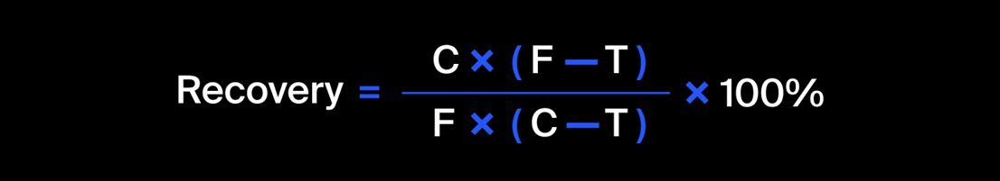

где:
* C — доля золота в концентрате после флотации/очистки;
* F — доля золота в сырье/концентрате до флотации/очистки;
* T — доля золота в отвальных хвостах после флотации/очистки.

Вычислим её на обучающей выборке и сравним с признаком *rougher.output.recovery*. 

In [8]:
# Проверим признаки:
# data['train']['rougher.output.concentrate_au']
# data['train']['rougher.input.feed_au']
# data['train']['rougher.output.tail_au']
# data['train']['rougher.output.recovery']
# на отсутствие нулевых значений:

names = ['rougher.output.concentrate_au', 'rougher.input.feed_au',
        'rougher.output.tail_au', 'rougher.output.recovery']

print(" Количество нулевых значений в признаках, используемых \
для расчета эффективности обогащения:\n")

for name in names:
    print(name, ':', data['train'][name].isna().sum())


 Количество нулевых значений в признаках, используемых для расчета эффективности обогащения:

rougher.output.concentrate_au : 0
rougher.input.feed_au : 0
rougher.output.tail_au : 0
rougher.output.recovery : 0


In [9]:
# Теперь спокойно рассчитаем значение *Recovery* (эффективность обогащения):
data['train']['recovery'] = \
    (data['train']['rougher.output.concentrate_au'] * \
     (data['train']['rougher.input.feed_au'] - \
      data['train']['rougher.output.tail_au'])) / \
    (data['train']['rougher.input.feed_au'] * \
     (data['train']['rougher.output.concentrate_au'] - \
      data['train']['rougher.output.tail_au'])) * 100

# Найдем MAE между нашими расчётами ('recovery') и 
# значением признака ('rougher.output.recovery'):
#print('Recovery:', (data['train']['rougher.output.recovery'] - \
#                    data['train']['recovery']).sum() / data['train'].shape[0])

# Используем библиотечную функцию:
mae_my = mean_absolute_error(data['train']['rougher.output.recovery'], 
                    data['train']['recovery'])
print('Recovery:', mae_my)

#Удалить созданный признак data['train']['recovery']
data['train'].drop(['recovery'] , axis= 1 , inplace= True )

Recovery: 9.73512347450521e-15


Выводы после проверки правильности расчёта эффективности обогащения:
1. Расхождение между реальными и расчетными значениями эффективности обогащения близки к 0 (1e-16).
2. Таким образом, **эффективность обогащения рассчитана правильно**.

### 2.4. Изучим **пропущенные значения:**

In [10]:
print("Общее количество пропущенных данных в датасете:\n")
for key_df in data:
    print(key_df, data[key_df].isna().sum().sum())

Общее количество пропущенных данных в датасете:

full 4481
train 4100
test 90


#### 2.4.1. Количество количество пропущенных данных для каждого признака и распределение данных по каждому признаку.

In [11]:
for key_df in tqdm(data):
    print('датасет:', key_df)
    skim(data[key_df])
    Separating_line()
    
#for key_df in tqdm(data):
#    print(data[key_df].describe())    

  0%|          | 0/3 [00:00<?, ?it/s]

датасет: full


╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 19439  │ │ float64     │ 86    │                                                          │
│ │ Number of columns │ 87     │ │ string      │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name            ┃ NA    ┃ NA %    ┃ mean   ┃ sd      ┃ p0        ┃ p25   ┃ p75   ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ final.output.concent   │     1 │  0.0051 │    5.2 │     1.4 │         0 │   4.3 │   5.9 │      16 │   █▅   │  │
│ │ final.output.concent   │     1 │  0.0051 │     10 │     1.7 │         0 │   9.1 │    11 │      17 │   ▁█▂  │  │
│ │ final.output.concent   │   210 │     1.1 │    9.5 │     2.8 │         0 │   7.7 │    11 │      20 │  ▁█▅▂  │  │
│ │ final.output.concent   │     0 │       0 │     44 │     5.1 │         0 │    43 │    46 │      53 │     ▃█ │  │
│ │ final.output.recover   │     0 │       0 │     67 │      10 │         0 │    63 │    73 │     100 │    ▅█  │  │
│ │ final.output.tail_ag   │     1 │  0.0051 │    9.7 │     2.3 │         0 │   8.1 │    11 │      20 │  ▁██▁  │  │
│ │ final.output.tail_pb   │   100 │    0.52 │    2.7 │    0.95 │         0 │     2 │   3.3 │     5.8 │ ▁▄█▇▂  │  │
│ │ final.output.tail_so   │     6 │   0.031 │     11 │     2.9 │         0 │   8.9 │    12 │      22 │  ▁█▆▁  │  │
│ │ final.output.tail_au   │     0 │       0 │      3 │    0.92 │         0 │   2.5 │   3.6 │     8.2 │   ▆█▁  │  │
│ │ primary_cleaner.inpu   │    24 │    0.12 │    140 │      44 │    0.0031 │   110 │   180 │     270 │  ▂▇█▄▁ │  │
│ │ primary_cleaner.inpu   │    37 │    0.19 │    8.8 │     3.3 │         0 │   6.1 │    11 │      40 │  ▄█▁   │  │
│ │ primary_cleaner.inpu   │     0 │       0 │    7.3 │    0.61 │       1.1 │   6.9 │   7.7 │      16 │    █   │  │
│ │ primary_cleaner.inpu   │   100 │    0.54 │      1 │    0.51 │   4.6e-06 │   0.7 │   1.2 │     4.1 │  ▃█▂   │  │
│ │ primary_cleaner.outp   │     0 │       0 │    8.4 │     2.1 │         0 │   7.3 │   9.8 │      16 │  ▁▆█▂  │  │
│ │ primary_cleaner.outp   │   120 │     0.6 │    9.8 │     2.6 │         0 │   8.7 │    11 │      17 │  ▁▃█▄  │  │
│ │ primary_cleaner.outp   │   370 │     1.9 │     10 │     3.9 │         0 │   7.9 │    13 │      22 │ ▁▄█▆▃  │  │
│ │ primary_cleaner.outp   │     0 │       0 │     32 │     5.6 │         0 │    30 │    35 │      46 │    ▃█▁ │  │
│ │ primary_cleaner.outp   │     4 │   0.021 │     16 │     3.5 │         0 │    14 │    18 │      29 │   ▅█▂  │  │
│ │ primary_cleaner.outp   │    21 │    0.11 │    3.4 │     1.4 │         0 │   2.5 │   4.2 │     9.6 │ ▁█▇▂▁  │  │
│ │ primary_cleaner.outp   │    62 │    0.32 │      8 │     2.2 │         0 │   6.7 │   9.5 │      22 │  ▁▄█▁  │  │
│ │ primary_cleaner.outp   │     0 │       0 │    3.9 │     1.6 │         0 │   2.9 │   4.6 │      18 │  ▃█▁   │  │
│ │ primary_cleaner.stat   │     4 │   0.021 │   1600 │     130 │   5.4e-32 │  1500 │  1700 │    2100 │    ▁█▁ │  │
│ │ primary_cleaner.stat   │     1 │  0.0051 │   -490 │ 

--------------------------------------------------------------------------------
датасет: train


╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 14149  │ │ float64     │ 86    │                                                          │
│ │ Number of columns │ 87     │ │ string      │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name            ┃ NA    ┃ NA %    ┃ mean   ┃ sd      ┃ p0        ┃ p25   ┃ p75   ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ final.output.concent   │     1 │  0.0071 │    5.1 │     1.4 │         0 │   4.2 │   5.9 │      16 │   █▅   │  │
│ │ final.output.concent   │     1 │  0.0071 │     10 │     1.7 │         0 │   9.3 │    11 │      17 │   ▁█▂  │  │
│ │ final.output.concent   │   210 │     1.5 │    9.2 │     2.8 │         0 │   7.5 │    10 │      18 │  ▁█▅▂▁ │  │
│ │ final.output.concent   │     0 │       0 │     44 │     4.9 │         0 │    43 │    46 │      53 │     ▄█ │  │
│ │ final.output.recover   │     0 │       0 │     67 │      10 │         0 │    63 │    72 │     100 │   ▁▆█  │  │
│ │ final.output.tail_ag   │     0 │       0 │    9.6 │     2.3 │         0 │     8 │    11 │      20 │  ▁█▆▁  │  │
│ │ final.output.tail_pb   │   100 │    0.71 │    2.6 │    0.97 │         0 │   1.9 │   3.2 │     5.6 │ ▁▅█▆▂  │  │
│ │ final.output.tail_so   │     5 │   0.035 │     11 │       3 │         0 │   8.8 │    12 │      22 │  ▁█▅▁  │  │
│ │ final.output.tail_au   │     0 │       0 │    2.9 │     0.9 │         0 │   2.4 │   3.4 │     8.2 │   ▇█▁  │  │
│ │ primary_cleaner.inpu   │    20 │    0.14 │    130 │      39 │    0.0031 │   110 │   160 │     250 │  ▂▇█▄▁ │  │
│ │ primary_cleaner.inpu   │    32 │    0.23 │    8.9 │     3.4 │         0 │     6 │    12 │      20 │ ▁▆█▅▂  │  │
│ │ primary_cleaner.inpu   │     0 │       0 │    7.3 │    0.61 │       1.1 │     7 │   7.7 │      10 │    █▇  │  │
│ │ primary_cleaner.inpu   │   100 │    0.71 │   0.89 │    0.37 │   4.6e-06 │  0.61 │   1.1 │     2.5 │ ▂██▃▁  │  │
│ │ primary_cleaner.outp   │     0 │       0 │    8.2 │       2 │         0 │   7.1 │   9.5 │      16 │  ▁▇█▁  │  │
│ │ primary_cleaner.outp   │    86 │    0.61 │    9.6 │     2.7 │         0 │   8.3 │    11 │      17 │  ▁▃█▃  │  │
│ │ primary_cleaner.outp   │   290 │       2 │     10 │     4.1 │         0 │   7.5 │    13 │      22 │ ▁▄█▅▃  │  │
│ │ primary_cleaner.outp   │     0 │       0 │     32 │     5.8 │         0 │    31 │    35 │      46 │    ▂█▁ │  │
│ │ primary_cleaner.outp   │     1 │  0.0071 │     16 │     3.7 │         0 │    14 │    18 │      29 │   ▆█▃  │  │
│ │ primary_cleaner.outp   │    15 │    0.11 │    3.4 │     1.5 │         0 │   2.4 │   4.3 │     9.6 │ ▁█▆▂▁  │  │
│ │ primary_cleaner.outp   │    46 │    0.33 │    7.5 │     2.1 │         0 │   6.3 │   8.9 │      21 │  ▁▄█▁  │  │
│ │ primary_cleaner.outp   │     0 │       0 │    3.8 │     1.6 │         0 │   2.9 │   4.5 │      18 │  ▄█▁   │  │
│ │ primary_cleaner.stat   │     4 │   0.028 │   1600 │     130 │    0.0064 │  1600 │  1700 │    2100 │     █▁ │  │
│ │ primary_cleaner.stat   │     1 │  0.0071 │   -490 │ 

--------------------------------------------------------------------------------
датасет: test


╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 5290   │ │ float64     │ 52    │                                                          │
│ │ Number of columns │ 53     │ │ string      │ 1     │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━━━━┓  │
│ ┃ column_name                ┃ NA  ┃ NA %    ┃ mean   ┃ sd     ┃ p0        ┃ p25   ┃ p75   ┃ p100  ┃ hist    ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━━━━┩  │
│ │ primary_cleaner.inpu       │   4 │   0.076 │    170 │     43 │       2.6 │   150 │   210 │   270 │  ▁▃▇█▃  │  │
│ │ primary_cleaner.inpu       │   5 │   0.095 │    8.7 │    3.1 │    0.0038 │   6.5 │    10 │    40 │   ▄█▁   │  │
│ │ primary_cleaner.inpu       │   0 │       0 │    7.3 │   0.61 │       5.7 │   6.9 │   7.6 │    16 │   █▇    │  │
│ │ primary_cleaner.inpu       │   4 │   0.076 │    1.4 │   0.64 │     0.005 │  0.91 │   1.8 │   4.1 │  ▁█▄▂   │  │
│ │ primary_cleaner.stat       │   0 │       0 │   1500 │    120 │   5.4e-32 │  1500 │  1600 │  2100 │     ▂█  │  │
│ │ primary_cleaner.stat       │   0 │       0 │   -500 │     20 │      -800 │  -500 │  -500 │   -57 │     █   │  │
│ │ primary_cleaner.stat       │   0 │       0 │   1500 │    120 │   6.6e-32 │  1500 │  1600 │  1800 │     ▅█  │  │
│ │ primary_cleaner.stat       │   0 │       0 │   -500 │     33 │      -800 │  -500 │  -500 │  -140 │     █   │  │
│ │ primary_cleaner.stat       │   0 │       0 │   1500 │    120 │     4e-32 │  1500 │  1600 │  1700 │     ▂█  │  │
│ │ primary_cleaner.stat       │   0 │       0 │   -500 │     22 │      -800 │  -500 │  -500 │  -150 │     █   │  │
│ │ primary_cleaner.stat       │   0 │       0 │   1500 │    120 │     4e-32 │  1500 │  1600 │  1900 │     ██  │  │
│ │ primary_cleaner.stat       │   0 │       0 │   -500 │     31 │      -800 │  -500 │  -500 │  -160 │     █   │  │
│ │ rougher.input.feed_a       │   0 │       0 │    9.4 │    1.9 │      0.57 │   8.1 │    11 │    14 │   ▃▆█▁  │  │
│ │ rougher.input.feed_p       │   0 │       0 │    3.8 │   0.95 │      0.27 │   3.2 │   4.3 │   6.9 │   ▁▆█▃  │  │
│ │ rougher.input.feed_r       │   3 │   0.057 │    490 │    110 │     0.003 │   410 │   580 │   710 │   ▁▇█▅  │  │
│ │ rougher.input.feed_s       │   1 │   0.019 │     56 │     19 │     0.046 │    44 │    62 │   390 │   █▂    │  │
│ │ rougher.input.feed_s       │  21 │     0.4 │     38 │    5.5 │       1.4 │    35 │    42 │    53 │    ▅█▁  │  │
│ │ rougher.input.feed_a       │   0 │       0 │    9.3 │    1.6 │      0.57 │   8.2 │    10 │    14 │   ▂▅█▁  │  │
│ │ rougher.input.floatb       │   5 │   0.095 │     14 │    3.4 │    0.0011 │    12 │    17 │    24 │   ▁▆█▅  │  │
│ │ rougher.input.floatb       │   0 │       0 │    6.5 │    1.1 │   0.00057 │     6 │   7.1 │   8.9 │    ▃█▂  │  │
│ │ rougher.input.floatb       │   8 │    0.15 │     14 │    3.2 │   7.7e-05 │    12 │    17 │    24 │   ▁▅█▅  │  │
│ │ rougher.input.floatb       │  25 │    0.47 │    6.5 │   0.89 │     0.007 │     6 │   7.1 │   8.6 │    ▂█▃  │  │
│ │ rougher.state.floatb       │   0 │       0 │   1100 

--------------------------------------------------------------------------------


Отмечаем:
1. Пропущенных значений немного. Обычно это единицы или десятки. И лишь в некоторых признаках пропуски исчисляются сотнями.
Есть два исключения:
* в датасете data['full] в признаке 'secondary_cleaner.output.tail_sol': 1700. Что составляет 9% от общего их количества.
* в датасете data['train'] в признаке 'secondary_cleaner.output.tail_sol': 1600, это 11% от общего количества. 

В датасете data['test']  в признаке 'rougher.input.floatbank11_xanthate'. Всего 25, что составляет 0.47% от общего их количества.

2. Присутствуют отрицательные значения в признаках типа 'primary_cleaner.state.floatbank8_a_level'. Присутствуют a, b, c, d уровни. Отрицательные значения, видимо, говорят об уровне ниже 'полного' значения на измереную и указанную в датасет величину.

3. Значения 'rougher.calculation.sulfate_to_au_concentrate' имеет широкий диапазон: от отрицательных значений - 4.2e7 до 3.4e4. В дальнейшем придется выполнять масштабирование.

4. Довольно много встречается значений, равных '0'. Это подозрительно. Чаще всего '0' свидетельствует об отсутствии аналитического сигнала.

5. Распределение аналитических значений в признаках в основном близко к нормальному. есть смещения в одну или другую сторону.



#### 2.4.2. Распределенние пропущенных данных в датасете 'train' по разным временным параметрам.

In [12]:
# переведём столбец с датой в тип datetime "дата"

data['train']['date'] = pd.to_datetime(data['train']['date'], errors='coerce')

data['train']['hour'] = pd.DatetimeIndex(data['train']['date']).hour
data['train']['day_month'] = pd.DatetimeIndex(data['train']['date']).day
data['train']['month'] = pd.DatetimeIndex(data['train']['date']).month
data['train']['year'] = pd.DatetimeIndex(data['train']['date']).year

#days_in_week={
#    0: 'Monday', 
#    1: 'Tuesday', 
#    2: 'Wednesday', 
#    3: 'Thursday', 
#    4: 'Friday',
#    5: 'Saturday', 
#    6: 'Sunday'
#} 
days_in_week={0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6} 
data['train']['day_week']=pd.DatetimeIndex(data['train']['date']).weekday.map(days_in_week)

In [13]:
# Проверим, что получилось:
data['train'].sample(2)

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,hour,day_month,month,year,day_week
878,2016-02-24 00:00:00,5.828,12.580,10.918,40.000,74.317,12.936,2.356,10.449,3.100,152.474,8.957,8.170,0.710,10.292,9.509,15.483,31.388,16.637,3.503,7.808,3.429,1696.221,-399.846,1701.258,-400.279,1699.413,-399.652,1265.777,-400.946,46843.400,3094.579,3101.765,2.037,12.043,4.840,349.198,41.465,29.983,9.860,11.031,5.497,11.042,5.500,12.393,9.078,28.777,20.305,91.336,5.490,0.324,12.477,1.535,1099.957,-499.989,1651.081,-499.928,1650.251,-499.777,1652.742,-499.561,1600.817,-499.430,1599.995,-500.294,15.138,5.189,10.631,3.856,31.121,-399.651,29.051,-399.134,31.038,-382.258,28.968,-400.847,16.005,-499.755,14.110,-499.585,12.086,-500.563,10.000,-500.066,20.012,-499.637,0,24,2,2016,2
4199,2016-08-11 03:59:59,6.815,8.754,9.577,42.697,73.179,10.834,2.771,10.675,3.156,139.148,9.512,7.070,0.463,10.938,10.243,14.409,30.426,13.458,2.107,10.921,4.289,1600.624,-499.132,1602.092,-500.730,1601.145,-500.281,1649.799,-500.352,35983.680,2675.778,2678.728,2.576,10.898,3.801,450.392,60.466,40.090,9.791,12.004,6.096,12.010,6.099,13.224,6.629,25

  0%|          | 0/5 [00:00<?, ?it/s]

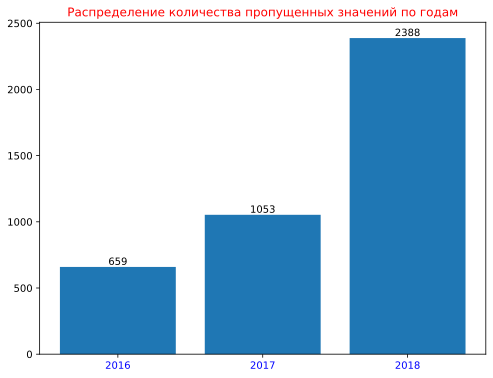

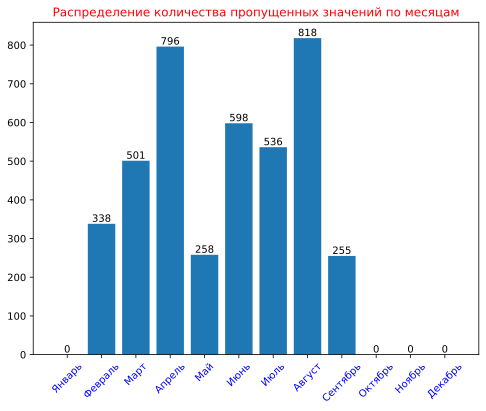

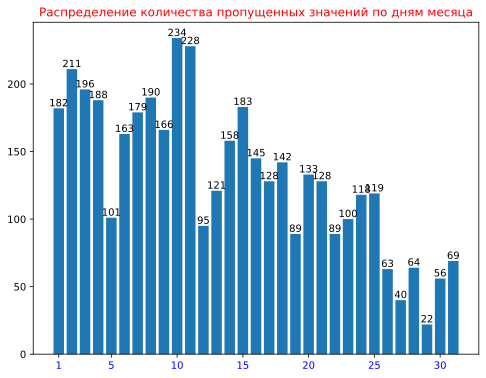

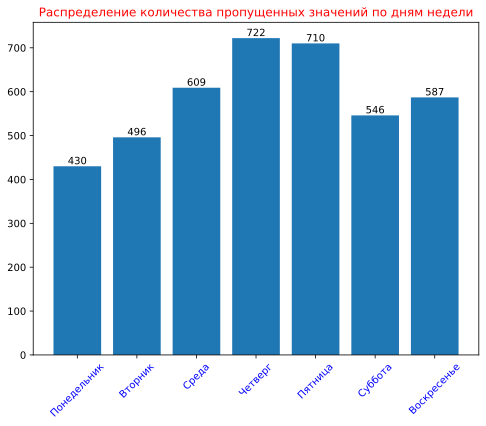

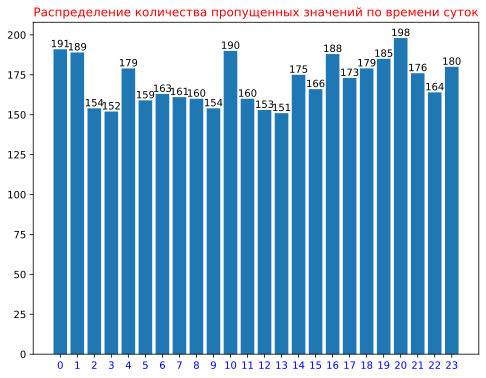

In [14]:
list_prisnaks = ['year', 'month', 'day_month', 'day_week', 'hour']
title_base = "Распределение количества пропущенных значений по "
list_titles = ['годам', 'месяцам', 'дням месяца', 'дням недели', 'времени суток']

days_in_month = [
    'Январь',   'Февраль', 'Март',   'Апрель', 
    'Май',      'Июнь',    'Июль',   'Август',
    'Сентябрь', 'Октябрь', 'Ноябрь', 'Декабрь'
]

days_week = ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница',
             'Суббота', 'Воскресенье']


def correct_data(axes_x, axes_y, num_prisnak):
    
    if num_prisnak == 'month':
        res_axes_y = []
        for i in range(12):
            res_axes_y.append(0)                 
        for days_month in axes_x:
            res_axes_y[days_in_month.index(days_in_month[days_month])] = \
                axes_y[days_in_month.index(days_in_month[days_month])-1]
        return days_in_month, res_axes_y           
                
    if num_prisnak == 'day_week':
        res_axes_y = []
        for i in range(7):
            res_axes_y.append(0)
        for i in range(7):
            res_axes_y[axes_x[i]] = axes_y[axes_x.index(axes_x[i])]
        return days_week, res_axes_y


for num_prisnak in tqdm(range(len(list_prisnaks))):

    list_X = list(data['train'][list_prisnaks[num_prisnak]].unique())
    
    list_empties = []
    for x in list_X:
        df = data['train'][data['train'][list_prisnaks[num_prisnak]] == x]
        list_empties.append(df.isna().sum().sum())
    
    if list_prisnaks[num_prisnak] in ['month', 'day_week']:
        list_X, list_empties = correct_data(list_X, list_empties, 
                                            list_prisnaks[num_prisnak])
        
    plt.figure(figsize = (8,6))    
    plt.bar(list_X, list_empties)
    for i in range(len(list_X)):
        plt.text(list_X[i], list_empties[i], int(list_empties[i]), 
                 horizontalalignment='center', verticalalignment='bottom', 
                 fontdict={'fontweight':500, 'size':10}) 
        
    if list_prisnaks[num_prisnak] == 'day_month':
        plt.xticks([1, 5, 10, 15, 20, 25, 30], fontsize=10, color='blue')
    elif list_prisnaks[num_prisnak] in ['month', 'day_week']:        
        plt.xticks(list_X, fontsize=10, color='blue', rotation=45)
    else:
        plt.xticks(list_X, fontsize=10, color='blue')
    
    my_title = title_base + list_titles[num_prisnak]
    plt.title(my_title, fontsize=12, color='red')
    plt.show()

**Из приведенных распределений отмечаем:**
1. Количество пропущенных значений удваиваивается с каждым годом.
2. По результатам наблюдений в 2016-2018 годах установлено очень неровное количество пропущенных значений по месяцам. В четыре месяца (январь, октябрь, ноябрь и декабрь) пропущенных значений нет совсем. А больше всего их в апреле и августе.
3. В последнюю неделю каждого месяца количество пропущенных значений минимально.
4. Традиционно минимальное количество пропущенных значений в понедельник-вторник с пиками в четверг-пятница.
5. По времени суток закономерностей не выявлено.

#### 2.4.3. Удалим более ненужные признаки

In [15]:
# Проверим, какие признаки есть в нашем датасете:
data['train'].head(2)

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,hour,day_month,month,year,day_week
0,2016-01-15 00:00:00,6.055,9.890,5.507,42.192,70.541,10.412,0.895,16.904,2.143,127.092,10.128,7.250,0.989,8.548,10.390,19.529,34.174,14.937,2.535,7.476,2.107,1549.776,-498.912,1551.434,-516.403,1549.874,-498.667,1554.367,-493.428,41885.707,3481.779,3520.337,2.839,6.100,2.285,523.546,55.487,36.809,6.486,11.987,6.008,11.837,6.006,11.501,7.101,28.029,19.794,87.108,5.008,0.509,19.154,1.170,999.707,-404.067,1603.011,-434.715,1602.375,-442.204,1598.937,-451.294,1404.472,-455.463,1416.355,-451.940,14.500,4.695,8.765,2.606,25.853,-498.526,23.894,-501.406,23.962,-495.263,21.940,-499.341,14.017,-502.488,12.100,-504.716,9.926,-498.310,8.080,-500.471,14.151,-605.842,0,15,1,2016,4
1,2016-01-15 01:00:00,6.029,9.969,5.258,42.702,69.266,10.463,0.927,16.635,2.225,125.629,10.296,7.250,1.003,8.559,10.497,19.369,34.119,16.251,3.050,6.734,2.353,1576.167,-500.905,1575.951,-499.866,1575.994,-499.315,1574.479,-498.932,42050.862,3498.371,3489.982,2.859,6.161,2.266,525.291,57.279,35.753,6.479,11.971,6.006,11.996,6.013,11.616,7.279,28.067,20.051,8

In [16]:
delete_col = ['hour', 'day_month', 'month', 'year', 'day_week']
data['train'] = data['train'].drop(delete_col, axis=1)

# Проверим, что принзнаки удалены:
data['train'].head(2)

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.output.concentrate_ag,primary_cleaner.output.concentrate_pb,primary_cleaner.output.concentrate_sol,primary_cleaner.output.concentrate_au,primary_cleaner.output.tail_ag,primary_cleaner.output.tail_pb,primary_cleaner.output.tail_sol,primary_cleaner.output.tail_au,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.calculation.sulfate_to_au_concentrate,rougher.calculation.floatbank10_sulfate_to_au_feed,rougher.calculation.floatbank11_sulfate_to_au_feed,rougher.calculation.au_pb_ratio,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.output.concentrate_ag,rougher.output.concentrate_pb,rougher.output.concentrate_sol,rougher.output.concentrate_au,rougher.output.recovery,rougher.output.tail_ag,rougher.output.tail_pb,rougher.output.tail_sol,rougher.output.tail_au,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.output.tail_ag,secondary_cleaner.output.tail_pb,secondary_cleaner.output.tail_sol,secondary_cleaner.output.tail_au,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055,9.890,5.507,42.192,70.541,10.412,0.895,16.904,2.143,127.092,10.128,7.250,0.989,8.548,10.390,19.529,34.174,14.937,2.535,7.476,2.107,1549.776,-498.912,1551.434,-516.403,1549.874,-498.667,1554.367,-493.428,41885.707,3481.779,3520.337,2.839,6.100,2.285,523.546,55.487,36.809,6.486,11.987,6.008,11.837,6.006,11.501,7.101,28.029,19.794,87.108,5.008,0.509,19.154,1.170,999.707,-404.067,1603.011,-434.715,1602.375,-442.204,1598.937,-451.294,1404.472,-455.463,1416.355,-451.940,14.500,4.695,8.765,2.606,25.853,-498.526,23.894,-501.406,23.962,-495.263,21.940,-499.341,14.017,-502.488,12.100,-504.716,9.926,-498.310,8.080,-500.471,14.151,-605.842
1,2016-01-15 01:00:00,6.029,9.969,5.258,42.702,69.266,10.463,0.927,16.635,2.225,125.629,10.296,7.250,1.003,8.559,10.497,19.369,34.119,16.251,3.050,6.734,2.353,1576.167,-500.905,1575.951,-499.866,1575.994,-499.315,1574.479,-498.932,42050.862,3498.371,3489.982,2.859,6.161,2.266,525.291,57.279,35.753,6.479,11.971,6.006,11.996,6.013,11.616,7.279,28.067,20.051,86.843,4.955,0.537,18.965,1.185,1000.286,-400.065,

#### 2.4.4. Количество пропущенных значений по каждому признаку.

In [17]:
print('Список признаков, в которых число пропусков превышает 100:')

list_empty = []
list_columns = []
for i in tqdm(range(data['train'].shape[1])):
    if( data['train'].isna().sum()[i] > 100):
        list_empty.append(data['train'].isna().sum()[i])
        list_columns.append(data['train'].columns[i])

df = pd.DataFrame(list(zip(list_columns, list_empty)), \
                  columns=['Признак', 'Кол-во пропусков']) 
df      

Список признаков, в которых число пропусков превышает 100:


  0%|          | 0/87 [00:00<?, ?it/s]

,Признак,Кол-во пропусков
0,final.output.concentrate_sol,211
1,primary_cleaner.output.concentrate_sol,286
2,rougher.input.feed_size,144
3,rougher.input.floatbank11_xanthate,428
4,rougher.state.floatbank10_e_air,436
5,secondary_cleaner.output.tail_sol,1605
6,secondary_cleaner.state.floatbank2_a_air,217


Видим:

1. Нет признаков, которые бы вместе были пропущены в сколь-нибудь значимом количестве. А потому, были бы взаимозависимы физически.

2. Больше всего пропусков в значении 'sol' (solvent) - концентрации раствора/коллоида.

#### 2.4.5. Проверим, в какой временной интервал случились максимальные 1605 пропусков для признака 'secondary_cleaner.output.tail_sol'.

In [18]:
list_cols = ['date', 'secondary_cleaner.output.tail_sol']

dframe = data['train'][list_cols].copy()
# переведём столбец с датой в тип datetime "дата"

dframe['date'] = pd.to_datetime(dframe['date'], errors='coerce')

dframe['hour'] = pd.DatetimeIndex(dframe['date']).hour
dframe['day_month'] = pd.DatetimeIndex(dframe['date']).day
dframe['month'] = pd.DatetimeIndex(dframe['date']).month
dframe['year'] = pd.DatetimeIndex(dframe['date']).year

days_in_week={0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6} 
dframe['day_week']=pd.DatetimeIndex(dframe['date']).weekday.map(days_in_week)

dframe.head(2)

,date,secondary_cleaner.output.tail_sol,hour,day_month,month,year,day_week
0,2016-01-15 00:00:00,8.765,0,15,1,2016,4
1,2016-01-15 01:00:00,9.001,1,15,1,2016,4


  0%|          | 0/5 [00:00<?, ?it/s]

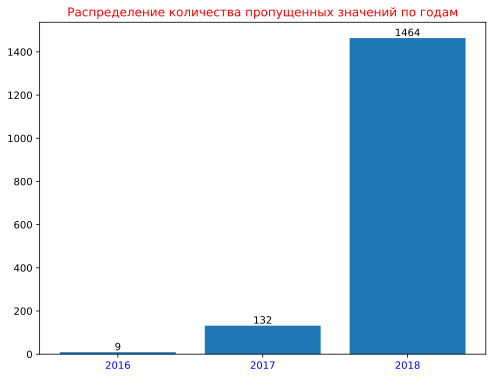

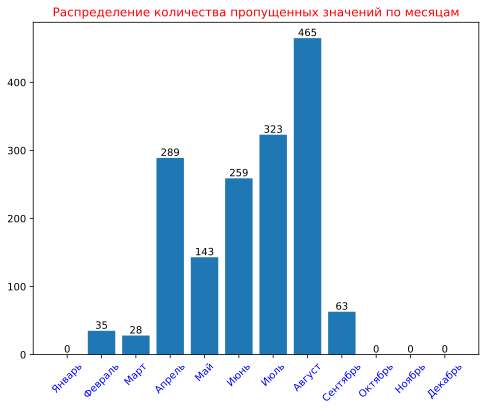

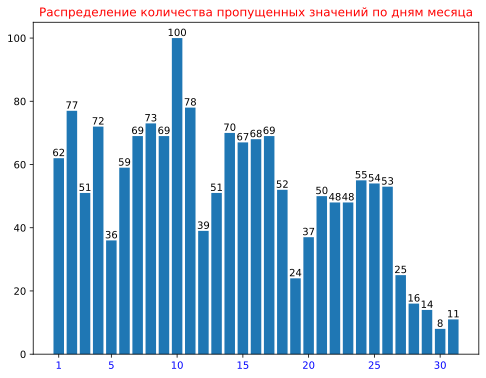

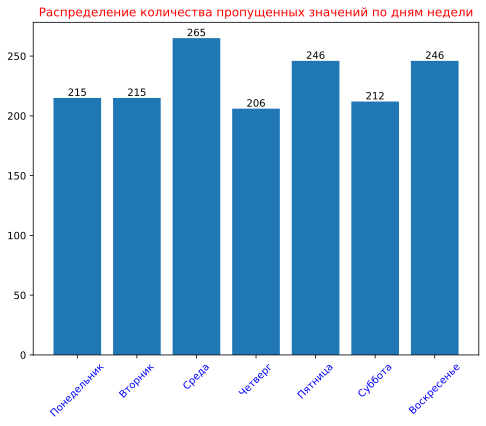

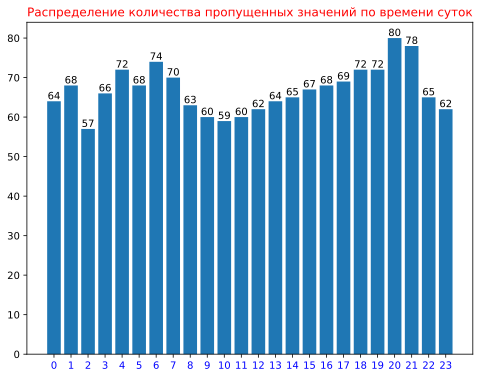

In [19]:
for num_prisnak in tqdm(range(len(list_prisnaks))):

    list_X = list(dframe[list_prisnaks[num_prisnak]].unique())
    
    list_empties = []
    for x in list_X:
        df = dframe[dframe[list_prisnaks[num_prisnak]] == x]
        list_empties.append(df.isna().sum().sum())
    
    if list_prisnaks[num_prisnak] in ['month', 'day_week']:
        list_X, list_empties = correct_data(list_X, list_empties, 
                                            list_prisnaks[num_prisnak])
        
    plt.figure(figsize = (8,6))    
    plt.bar(list_X, list_empties)
    for i in range(len(list_X)):
        plt.text(list_X[i], list_empties[i], int(list_empties[i]), 
                 horizontalalignment='center', verticalalignment='bottom', 
                 fontdict={'fontweight':500, 'size':10}) 
        
    if list_prisnaks[num_prisnak] == 'day_month':
        plt.xticks([1, 5, 10, 15, 20, 25, 30], fontsize=10, color='blue')
    elif list_prisnaks[num_prisnak] in ['month', 'day_week']:        
        plt.xticks(list_X, fontsize=10, color='blue', rotation=45)
    else:
        plt.xticks(list_X, fontsize=10, color='blue')
    
    my_title = title_base + list_titles[num_prisnak]
    plt.title(my_title, fontsize=12, color='red')
    plt.show()

In [20]:
sum1 = dframe['secondary_cleaner.output.tail_sol'].count()
dframe = dframe[(dframe.year == 2018) & (dframe.month > 2) & (dframe.month < 8)]
sum2 = dframe['secondary_cleaner.output.tail_sol'].count()

print('\nТаким образом, приходим к выводу, что из', sum1, 'пропусков признака')
print('"secondary_cleaner.output.tail_sol" {:d} ( {:.2%} )'.format(sum2, sum2/sum1), end='') 
print(' приходится на \nапрель-август 2018 года.\n')


Таким образом, приходим к выводу, что из 12544 пропусков признака
"secondary_cleaner.output.tail_sol" 1762 ( 14.05% ) приходится на 
апрель-август 2018 года.



In [21]:
sum1 = dframe['secondary_cleaner.output.tail_sol'].isna().sum()
dframe = dframe[(dframe.year == 2018) & (dframe.month > 2) & (dframe.month < 8)]
sum2 = dframe['secondary_cleaner.output.tail_sol'].isna().sum()

print('\nТаким образом, приходим к выводу, что из', sum1, 'пропусков признака')
print('"secondary_cleaner.output.tail_sol" {:d} ( {:.2%} )'.format(sum2, sum2/sum1), end='') 
print(' приходится на \nапрель-август 2018 года.\n')


Таким образом, приходим к выводу, что из 1354 пропусков признака
"secondary_cleaner.output.tail_sol" 1354 ( 100.00% ) приходится на 
апрель-август 2018 года.



#### 2.4.6. Заполнение пропущенных значений.

В задании на проект указано: **"Соседние по времени параметры часто похожи."** Это понятно, так как переданные нам данные - это результаты последовательных измерений в ходе технологического процесса. 

Заполним пропуски ближайшими значениями.

In [22]:
print("Количество пропущенных данных в исходных датасетах:")
for key_df in data:
    print(key_df, ':', data[key_df].isna().sum().sum())

# Для заполнения пропусков ближайшими значениями воспользуемся методом ffill() методом 'bfill':
for key_df in data:
    data[key_df] = data[key_df].fillna(method='ffill')

Separating_line()

print("Количество пропущенных данных после заполнения пропусков:")
for key_df in data:
    print(key_df, ':', data[key_df].isna().sum().sum())    

Количество пропущенных данных в исходных датасетах:
full : 4481
train : 4100
test : 90
--------------------------------------------------------------------------------
Количество пропущенных данных после заполнения пропусков:
full : 0
train : 0
test : 0


### 2.5.  Изучение признаков, отсутствующих в тестовой выборке.

In [23]:
lack = sorted(list(set(data['train'].columns) - set(data['test'].columns)))
for i in range(len(lack)):
    print(i+1, ' - ', lack[i])

1  -  final.output.concentrate_ag
2  -  final.output.concentrate_au
3  -  final.output.concentrate_pb
4  -  final.output.concentrate_sol
5  -  final.output.recovery
6  -  final.output.tail_ag
7  -  final.output.tail_au
8  -  final.output.tail_pb
9  -  final.output.tail_sol
10  -  primary_cleaner.output.concentrate_ag
11  -  primary_cleaner.output.concentrate_au
12  -  primary_cleaner.output.concentrate_pb
13  -  primary_cleaner.output.concentrate_sol
14  -  primary_cleaner.output.tail_ag
15  -  primary_cleaner.output.tail_au
16  -  primary_cleaner.output.tail_pb
17  -  primary_cleaner.output.tail_sol
18  -  rougher.calculation.au_pb_ratio
19  -  rougher.calculation.floatbank10_sulfate_to_au_feed
20  -  rougher.calculation.floatbank11_sulfate_to_au_feed
21  -  rougher.calculation.sulfate_to_au_concentrate
22  -  rougher.output.concentrate_ag
23  -  rougher.output.concentrate_au
24  -  rougher.output.concentrate_pb
25  -  rougher.output.concentrate_sol
26  -  rougher.output.recovery
27  

Видим, что:
* в датасете 'test' по сравнению с 'full', отсутствуют значения параметров продукта 'output' по всем операциям и по всем элементам, получаемые после выполнения основных операций.

Это находится в полном соответствии с заданием: "Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже." 

Поэтому таких данных у нас и нет. 

### 2.6. Добавление в тестовую выборку целевых признаков.

В условии задания указано, что: "В тестовом наборе нет целевых признаков."

Их действительно нет. Поэтому добавим целевые признаки 'rougher.output.recovery' и 'final.output.recovery' из исходных данных датасета data['full'] в тестовую выборку data['test'] с помощью метода .merge() по столбцу 'date':

In [24]:
data['test'] = data['test'].merge(data['full'].loc[:,
    ['date',"rougher.output.recovery","final.output.recovery"]],on = 'date')

# Проверим, что количество признаков увеличилось по сравнению с изначальным (53):
data['test'].shape

(5290, 55)

In [25]:
# Посмотрим парочку реальных данных с добавленными признаками:
data['test'].sample(2)

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,primary_cleaner.state.floatbank8_c_level,primary_cleaner.state.floatbank8_d_air,primary_cleaner.state.floatbank8_d_level,rougher.input.feed_ag,rougher.input.feed_pb,rougher.input.feed_rate,rougher.input.feed_size,rougher.input.feed_sol,rougher.input.feed_au,rougher.input.floatbank10_sulfate,rougher.input.floatbank10_xanthate,rougher.input.floatbank11_sulfate,rougher.input.floatbank11_xanthate,rougher.state.floatbank10_a_air,rougher.state.floatbank10_a_level,rougher.state.floatbank10_b_air,rougher.state.floatbank10_b_level,rougher.state.floatbank10_c_air,rougher.state.floatbank10_c_level,rougher.state.floatbank10_d_air,rougher.state.floatbank10_d_level,rougher.state.floatbank10_e_air,rougher.state.floatbank10_e_level,rougher.state.floatbank10_f_air,rougher.state.floatbank10_f_level,secondary_cleaner.state.floatbank2_a_air,secondary_cleaner.state.floatbank2_a_level,secondary_cleaner.state.floatbank2_b_air,secondary_cleaner.state.floatbank2_b_level,secondary_cleaner.state.floatbank3_a_air,secondary_cleaner.state.floatbank3_a_level,secondary_cleaner.state.floatbank3_b_air,secondary_cleaner.state.floatbank3_b_level,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level,rougher.output.recovery,final.output.recovery
1024,2016-10-23 18:59:59,143.943,5.504,7.200,0.898,1559.850,-499.867,1700.471,-500.917,1703.047,-502.452,1699.290,-498.999,9.041,3.541,379.514,44.243,35.141,10.541,12.994,5.998,13.005,6.002,1000.498,-499.887,1499.668,-400.079,1499.258,-399.697,1401.288,-400.721,1299.342,-300.179,1299.316,-298.932,32.015,-462.688,26.948,-500.425,32.996,-504.981,31.076,-508.773,19.974,-500.476,16.934,-500.297,16.988,-499.732,14.005,-499.536,24.998,-497.214,92.045,68.616
2691,2017-09-07 23:59:59,111.869,2.909,7.167,1.094,1602.274,-500.240,1601.931,-498.860,1602.407,-511.542,1599.053,-508.246,5.799,3.536,501.290,73.133,40.848,6.340,13.000,4.301,12.999,4.301,996.029,-300.048,1298.277,-500.269,1249.823,-499.796,1200.528,-499.460,1000.773,-499.349,1000.540,-499.226,30.026,-499.961,23.012,-502.380,25.021,-500.250,15.015,-500.241,11.986,-499.281,8.872,-398.625,13.978,-500.930,10.749,-500.357,15.005,-499.744,79.296,85.147


Убедились, что целевые признаки 'rougher.output.recovery' и 'final.output.recovery' добавлены в тестовую выборку.

### 2.7. Изучим наши данные на мультиколлинеарность признаков.
Посмотрим взаимную корреляцию признаков датасета на графике heatmap:

In [26]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for i in tqdm(range(1)):
    
# Распечатаем коэффициенты Пирсона на всю длину таблицы:    
#    with pd.option_context('display.max_rows', None,
#                       'display.max_columns', None,
#                       'display.precision', 1,
#                       ):
#        display(data['train'].corr())

    plt.figure(figsize=(40,40))

    sns.heatmap(data['train'].corr(), annot=True, annot_kws={"size":6}, fmt = '.2f', 
                cbar= False )
    plt.show()

  0%|          | 0/1 [00:00<?, ?it/s]

Отмечено наличие пар признаков с высоким уровнем взаимного влияния. 
Для моделей 'Дерево решений' и 'Случайное дерево' сильное взаимное влияние признаков не окажет негативного эффекта, а вот при 'Регрессии' нужно быть внимательнее.

### 2.8. Визуальная оценка нормальности распределений.

Построим гистограммы для всех признаков датасета 'train':

  0%|          | 0/1 [00:00<?, ?it/s]

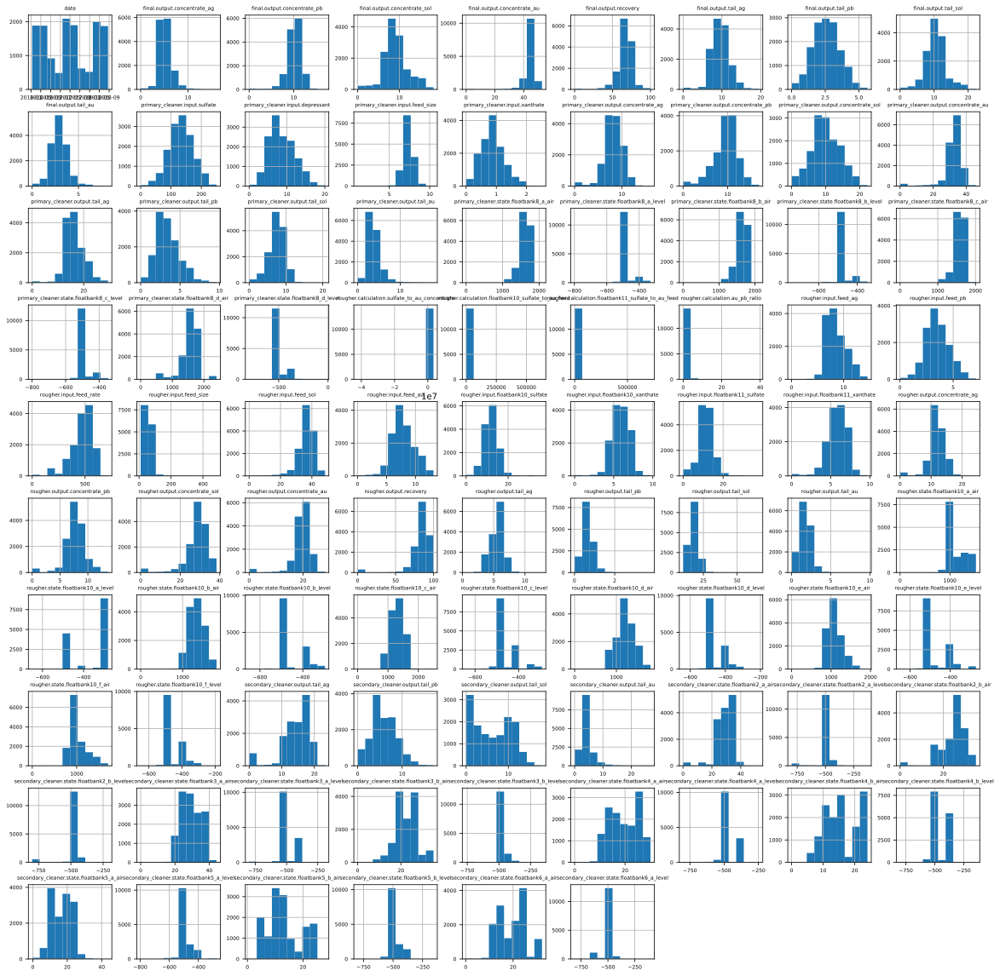

In [27]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for i in tqdm(range(1)):
    fig = data['train'].hist(figsize=(20, 20), bins=10, alpha=1.0, 
                       xlabelsize=6, ylabelsize=6)
    [x.title.set_size(6) for x in fig.ravel()]
    plt.show()

В основном наблюдаем нормальное распределение данных признаков.

### 2.9. Промежуточные выводы.

Для подготовки данных к последующей обработке были проведены следующие операции и сделаны следующие промежуточные выводы:

1.Успешно загружены данные из трех файлов:
* 'gold_recovery_full_new.csv',
* 'gold_recovery_train_new.csv',
* 'gold_recovery_test_new.csv'

2.Размер датасетов:
* full': (19439, 87) = 1_691_193.
* train': (14149, 87) = 1_230_963.
* test': (5290, 53) = 280_370.

3.Набор данных довольно большой. В обучающей выборке 14 149 строк х 87 столбцов. В тестовой выборке 5 290 строк х 53 столбцов.
* се признаки являются количественными. Категориальных признаков нет.
* азвания столбцов соответствуют требованию задания: ([этап].[тип_параметра].[название_параметра]). Например: rougher.input.feed_ag и в коррекции не нуждаются.
* Есть информация по содержаниям для трех химических элементов (Au, Ag, Pb). К сожалению, отсутствуют данные по наиболее важному элементу - Cu, который оказывает сильное влияние на флотацию и в концентрате его содержание доходит до 80%, создавая основу для золотосодержащих концентратов.
* Значения содержания золота находятся в диапазоне от 1 (в 'хвостах') до 50 в итоговом концентрате. Видимо, эти цифры даны в граммах на тонну (г/т)

4.Дубликатов в таблицах нет.

5.Расхождение между реальными и расчетными значениями эффективности обогащения близки к 0 (1e-16).  Эффективность обогащения рассчитана правильно.

6.Изучено распределение пропущенных значений по времени:
* Количество пропущенных значений удваиваивается с каждым годом.
* По результатам наблюдений в 2016-2018 годах установлено очень неровное количество пропущенных значений по месяцам. В четыре месяца (январь, октябрь, ноябрь и декабрь) пропущенных значений нет совсем. А больше всего их в апреле и августе.
* В последнюю неделю каждого месяца количество пропущенных значений минимально.
* Из максимального количества в 1605 пропусков признака "secondary_cleaner.output.tail_sol" сразу 1354 приходится на апрель-август 2018 года.

7.Пропуски заполнены ближайшими значениями, в соответствии с заданием: "Соседние по времени параметры часто похожи".

8.Добавлены целевые признаки 'rougher.output.recovery' и 'final.output.recovery' из исходных данных датасета data['full'] в тестовую выборку data['test'] с помощью метода .merge() по столбцу 'date':

9.В датасете 'test' по сравнению с 'full', отсутствуют значения параметров продукта 'output' по всем операциям и по всем элементам, получаемые после выполнения основных операций. Это находится в полном соответствии с заданием: "Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже."

10.Изучены данные на мультиколлинеарность признаков. Для моделей 'Дерево решений' и 'Случайное дерево' сильное взаимное влияние признаков не окажет негативного эффекта, а вот при 'Регрессии' нужно быть внимательнее.

11.Построены гистограммы для всех признаков датасета 'train'. В основном наблюдаем нормальное распределение данных признаков.

## 3. Анализ данных

Задачи:

1.Посмотреть, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. Описать выводы.

2.Сравнить распределения размеров гранул сырья на обучающей и тестовой выборках. Если распределения сильно отличаются друг от друга, оценка модели будет неправильной.

3.Исследовать суммарную концентрацию всех веществ на разных стадиях: в сырье, в черновом и финальном концентратах. 

### 3.1. Изменение концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

  0%|          | 0/3 [00:00<?, ?it/s]

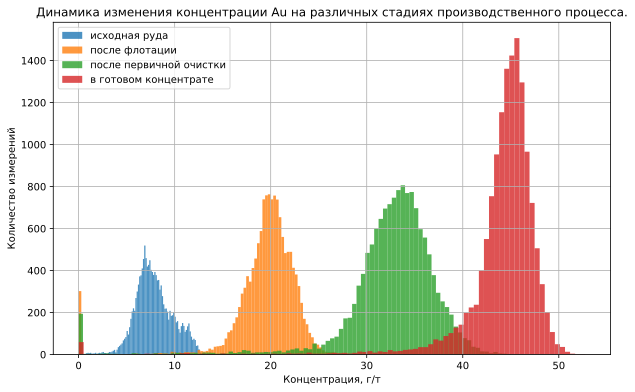

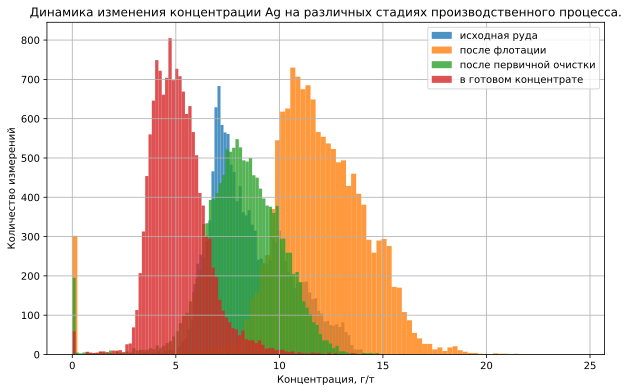

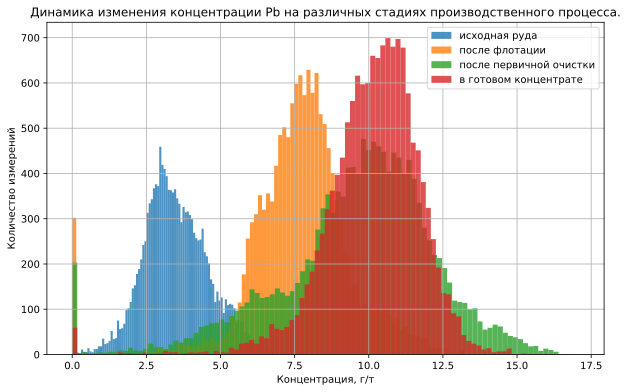

In [28]:
procedure = [
    'rougher.input.feed_',
    'rougher.output.concentrate_',
    'primary_cleaner.output.concentrate_',
    'final.output.concentrate_',
]
legend_rus = ['исходная руда', 'после флотации', 
              'после первичной очистки', 'в готовом концентрате']

metals = ['au', 'ag', 'pb']

for metal in tqdm(metals):
    plt.figure(figsize=(10, 6))
    plt.grid(True)
    plt.xlabel('Концентрация, г/т')
    plt.ylabel('Количество измерений')
    plt.title(f'Динамика изменения концентрации {metal.title()} на различных стадиях производственного процесса.')
    for proc in procedure:
        df = data['train'][f'{proc}{metal}']
        plt.hist(df, bins=100, alpha=0.8)
        plt.legend(legend_rus)

Отмечаем, что в распределениях со значениями концентрации присутствуют аномальные значения концентраций, равные нулю (самый левый пик). 

Удалим их. Это улучшит работу модели.

In [29]:
print('Размер датасета до удаления нулевых значений концентраций металлов:', data['train'].shape)

columns_with_concentrate = [column for column in data['train'].columns if 'concentrate_' in column]

for column in columns_with_concentrate:
    data['train'] = data['train'][data['train'][column] > 0]

print('Размер датасета после удаления нулевых значений концентраций металлов:', data['train'].shape)

Размер датасета до удаления нулевых значений концентраций металлов: (14149, 87)
Размер датасета после удаления нулевых значений концентраций металлов: (13716, 87)


  0%|          | 0/3 [00:00<?, ?it/s]

Элемент Au


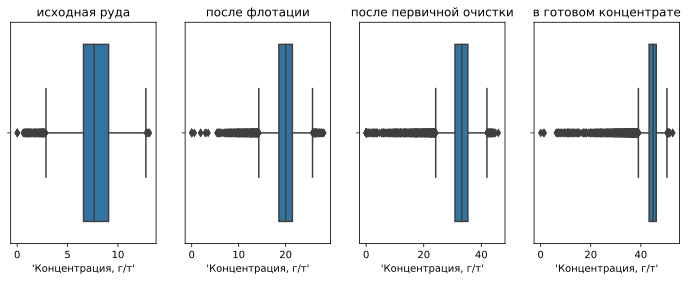

Элемент Ag


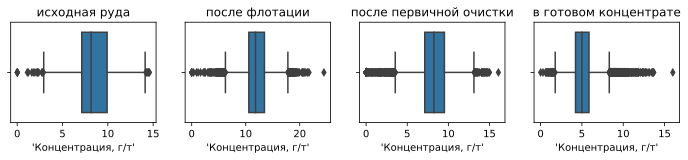

Элемент Pb


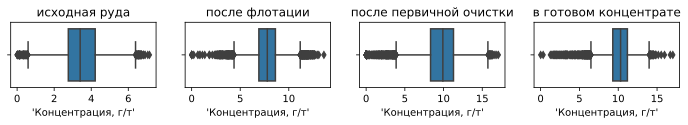

In [30]:
# Диаграмма размаха («ящик с усами») по распределению 
# концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

for n_metal in tqdm(range(len(metals))):
    fig = plt.figure(figsize = (12,4))
    print('Элемент', metals[n_metal].title())
        
    for n_proc in range(len(procedure)):
        ax = fig.add_subplot(n_metal+1, 4, n_proc+1)
        sns.boxplot(data['train'][f'{procedure[n_proc]}{metals[n_metal]}'], ax=ax)
        ax.set_title(legend_rus[n_proc])
        plt.xlabel("'Концентрация, г/т'")

    plt.show()

**Промежуточные выводы**
1. Концентрация золота повышается с каждым этапом. Цель производства - повысить концентрацию золота является достижимой. Содержание Au в результате повышается в 7-8 раз.

2. Концентрация серебра понижается с каждым шагом очистки. Судя по всему, основная цель предприятия - добыча золота и хозяева готовы мириться с потерей сопутствующего серебра.
Хотя это и довольно расточительно. В готовом концентрате содержание Ag около 5 грамм/тонну. В исходной руде серебра было около 7.5 г/т. Таким образом, потери составили около 2.5 г/т.  При  среднем для такого рода предприятий значения объёма добытой руды в 1 млн тонн, компания теряет около 2,5 тонны серебра в год. Что при нынешних ценах на серебро в 66.5 руб за грамм: https://investfunds.ru/indexes/225/?ysclid=lgux43pt30329660739 может стоить около 160 млн рублей. А если компания вообще не извлекает серебро, то упущенная выгода оценивается в 0.5 млрд рублей ежегодно.

3. Концентрация свинца повышается с 2.5 г/т в исходном сырье до примерно 10 г/т в готовом концентрате.

4. К сожалению, нет информации по содержанию Cu. А это - основа золотосодержащей руды.

5. Нулевые значения (они могут возникнуть только при отсутствии аналитического сигнала мы убрали.
Остальные отклонения от нормального распределения трогать не будем. Совсем уж аномальных (в десятки раз) значений не наблюдаем.

### 3.2. Сравнение распределений размеров гранул сырья на обучающей и тестовой выборках. 

Поработаем с параметром 'feed size' — размер гранул сырья.

В каждой из выборок есть следующие признаки размера гранул:
* 'rougher.input.feed_size' - размер гранул **ДО флотации**, т.е, исходного сырья.
* 'primary_cleaner.input.feed_size' - размер гранул **ПОСЛЕ флотации**, т.е. до первичной очистки.

Посмотрим их:

In [31]:
print('Обучающая выборка:')
display(data['train'][['rougher.input.feed_size', 'primary_cleaner.input.feed_size']].head(2))
print('Тестовая выборка:')
display(data['test'][['rougher.input.feed_size', 'primary_cleaner.input.feed_size']].head(2))

Обучающая выборка:


,rougher.input.feed_size,primary_cleaner.input.feed_size
0,55.487,7.250
1,57.279,7.250


Тестовая выборка:


,rougher.input.feed_size,primary_cleaner.input.feed_size
0,62.710,8.080
1,61.961,8.080


Отмечаем, что раздробили и размололи в 7-8 раз.

#### 3.2.1. Коэффициенты корреляции Пирсона между значениями размера гранул и целевыми признаками.

In [32]:
# Расситаем коэффициенты корреляции Пирсона.
# Данных не много. Цикл вводить не будем.

print(round(data['train']['rougher.input.feed_size'].corr(data['train']['rougher.output.recovery']), 2))
print(round(data['train']['rougher.input.feed_size'].corr(data['train']['final.output.recovery']), 2))
print()
print(round(data['test']['primary_cleaner.input.feed_size'].corr(data['test']['rougher.output.recovery']), 2))
print(round(data['test']['primary_cleaner.input.feed_size'].corr(data['test']['final.output.recovery']), 2))

0.09
0.05

0.01
0.07


### Замечаем:
* Существует слабая (< 0.3) корреляция между значениями размера гранул и целевыми признаками в обучающей выборке.
* Связь между значениями размера гранул и целевыми признаками в тестовой выборке отсутствует.

#### 3.2.2. Распределения размера гранул 'До' флотации, т.е. исходного сырья.

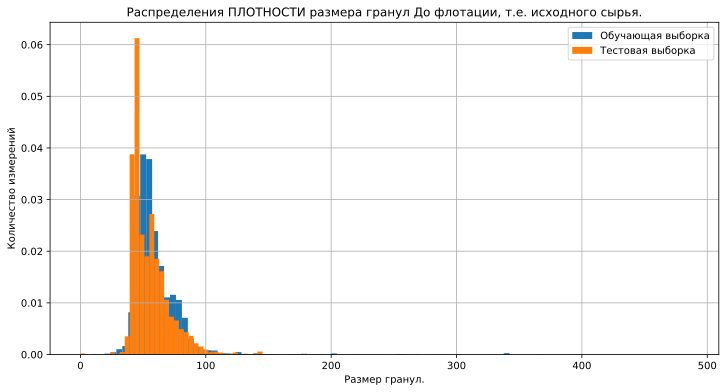

In [33]:
# Построим распределение ПЛОТНОСТИ размера гранул исходного сырья (признак 'rougher.input.feed_size') 
# на обучающей и тестовой выборках:

data['train']['rougher.input.feed_size'].hist(figsize=(12, 6), bins=100, density=True)
data['test']['rougher.input.feed_size'].hist(figsize=(12, 6), bins=100, density=True)

plt.grid(True)
plt.legend(['Обучающая выборка', 
            'Тестовая выборка'])
plt.xlabel("Размер гранул.")
plt.ylabel('Количество измерений')
plt.title("Распределения ПЛОТНОСТИ размера гранул До флотации, т.е. исходного сырья.")
plt.show()

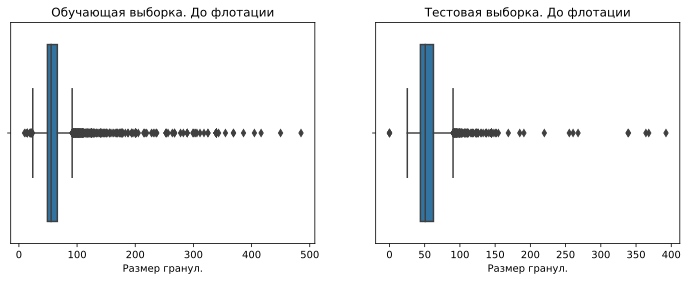

In [34]:
# Диаграмма размаха («ящик с усами») по распределению размеров гранул До флотации, т.е. исходного сырья.

fig = plt.figure(figsize = (12,4))

ax = fig.add_subplot(1, 2, 1)
sns.boxplot(data['train']['rougher.input.feed_size'], ax=ax)
ax.set_title('Обучающая выборка. До флотации')
plt.xlabel("Размер гранул.")

ax = fig.add_subplot(1, 2, 2)
sns.boxplot(data['test']['rougher.input.feed_size'], ax=ax)
ax.set_title('Тестовая выборка. До флотации')
plt.xlabel("Размер гранул.")

plt.show()

**Промежуточные выводы по распределению размера гранул гранул в исходной руде 'До' флотации:**
1. Распределения в обучающей и тестовой выборках очень похожи. В обоих случаях видим нормальное распределение со смещением 
в область более крупных размеров.
2. Отмечается много выбросов после размера гранул 100, вплоть до 500.

#### 3.2.3. Распределения размера гранул 'После' флотации, т.е. до первичной очистки.

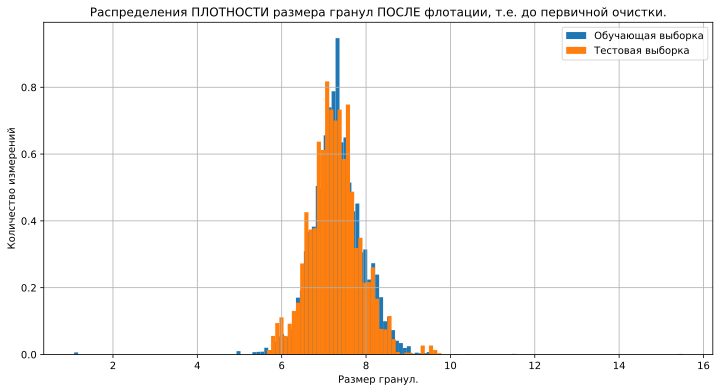

In [35]:
# Построим распределение ПЛОТНОСТИ размера гранул после флотации, т.е. до первичной очистки 
# (признак 'primary_cleaner.input.feed_size') на обучающей и тестовой выборках:

data['train']['primary_cleaner.input.feed_size'].hist(figsize=(12, 6), bins=100, density=True)
data['test']['primary_cleaner.input.feed_size'].hist(figsize=(12, 6), bins=100, density=True)
plt.grid(True)
plt.legend(['Обучающая выборка', 
            'Тестовая выборка'])
plt.xlabel("Размер гранул.")
plt.ylabel('Количество измерений')
plt.title("Распределения ПЛОТНОСТИ размера гранул ПОСЛЕ флотации, т.е. до первичной очистки.")
plt.show()

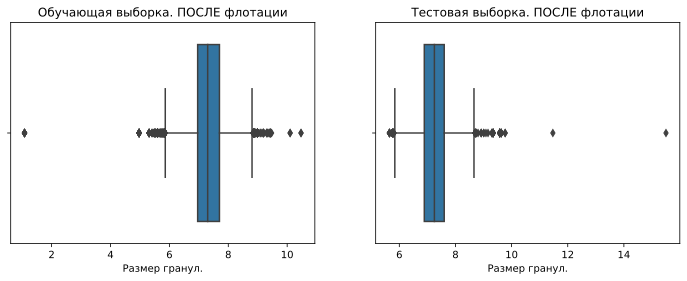

In [36]:
# Диаграмма размаха («ящик с усами») по распределению размеров гранул ПОСЛЕ флотации, т.е. до первичной очистки.

fig = plt.figure(figsize = (12,4))

ax = fig.add_subplot(1, 2, 1)
sns.boxplot(data['train']['primary_cleaner.input.feed_size'], ax=ax)
ax.set_title('Обучающая выборка. ПОСЛЕ флотации')
plt.xlabel("Размер гранул.")

ax = fig.add_subplot(1, 2, 2)
sns.boxplot(data['test']['primary_cleaner.input.feed_size'], ax=ax)
ax.set_title('Тестовая выборка. ПОСЛЕ флотации')
plt.xlabel("Размер гранул.")

plt.show()

**Промежуточные выводы по распределению размера гранул гранул в исходной руде 'ПОСЛЕ' флотации:**
1. Распределения в обучающей и тестовой выборках очень похожии имеют нормальное распределение.
2. Размер гранул сильно (в 7-8 раз) уменьшился по сравнению с размером гранул 'До' флотации.
3. В обучающей выборке отмечены аномальные выбросы с крупностью как до 6, так и более 9.
4. В тестовой выборке выбросов с крупностью менее 6 почти нет, но есть аномальные выбросы размером более 9.

5. До флотации проведено примерно в 2 раза больше замеров, нежели после флотации.

### 3.3. Изменение концентрации металлов (Au, Ag, Pb) в 'хвостах' на разных этапах техпроцесса.

  0%|          | 0/3 [00:00<?, ?it/s]

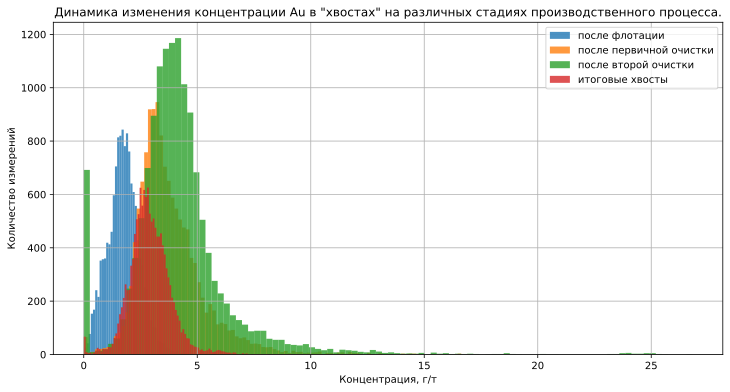

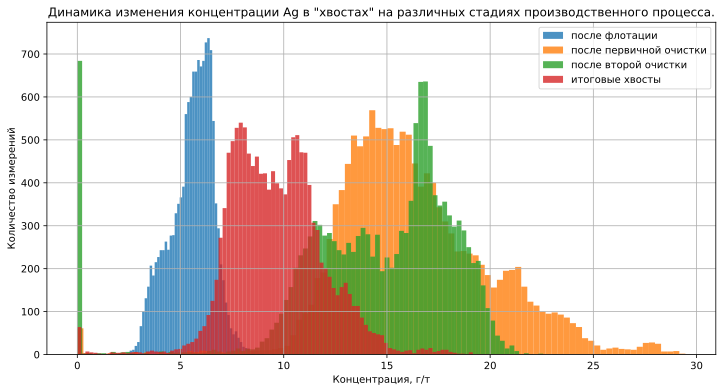

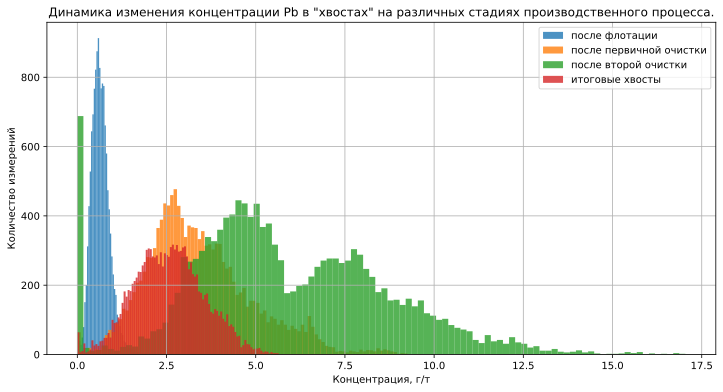

In [37]:
procedure = [
    'rougher.output.tail_',
    'primary_cleaner.output.tail_',
    'secondary_cleaner.output.tail_',
    'final.output.tail_'
]
legend_rus = ['после флотации', 'после первичной очистки',
              'после второй очистки', 'итоговые хвосты']

metals = ['au', 'ag', 'pb']

for metal in tqdm(metals):
    plt.figure(figsize=(12, 6))
    plt.grid(True)
    plt.xlabel('Концентрация, г/т')
    plt.ylabel('Количество измерений')
    plt.title(f'Динамика изменения концентрации {metal.title()} в "хвостах" на различных стадиях производственного процесса.')
    for proc in procedure:
        df = data['train'][f'{proc}{metal}']
        plt.hist(df, bins=100, alpha=0.8)
        plt.legend(legend_rus)

Отмечаем, что в распределениях со значениями концентрации 'в хвостах' присутствуют аномальные значения концентраций, равные нулю (самый левый пик).

Для улучшения работы модели удалим их.

In [38]:
print('Размер датасета до удаления нулевых значений концентраций металлов:', data['train'].shape)

columns_with_concentrate = [column for column in data['train'].columns if 'tail_' in column]

for column in columns_with_concentrate:
    data['train'] = data['train'][data['train'][column] > 0]

print('Размер датасета после удаления нулевых значений концентраций металлов:', data['train'].shape)

Размер датасета до удаления нулевых значений концентраций металлов: (13716, 87)
Размер датасета после удаления нулевых значений концентраций металлов: (12848, 87)


**Промежуточные выводы:**

1. по золоту:
* в 'хвосты' для последующей утилизации попадает материал с довольно большими содержаниями золота. Вплоть до 25 г/т! Рекомендуем технологам обратить внимание на такие серьезные потери золота в ходе технологического процесса. 
* на обеих стадиях очистки утилизируется материал с бОльшими концентрациями по золоту, чем на стадии флотации. Понятно, что на очистку после флотации попадает более 'богатый' материал. Но и потери тут более значимые.
2. по серебру:
* Материалы, 'богатые' серебром, также, как и золото, теряются на стадиях очистки.
* Утилизируется руда с концентрациями серебра вплоть до 30 г/т.
* Как уже отмечалось ранее, на производстве уделяется недостаточное внимание на добычу серебра. И в отходы отправляется руда с промышленными содержаниями по серебру.

3. по свинцу:
* Свинец тоже теряется на стадиях очистки.
* При флотации наблюдаются потери материалов с малым содержанием по свинцу.

4. Потери материалов с крупными содержаниями всех металлов идут в основном на стадиях очистки.

5. Признаки с информацией о содержании элементов в 'хвостах' были очищены от нулевых значений.

### 3.4. Исследование суммарной концентрации всех металлов (Au, Ag, Pb) на разных стадиях: в сырье, в черновом и финальном концентратах.

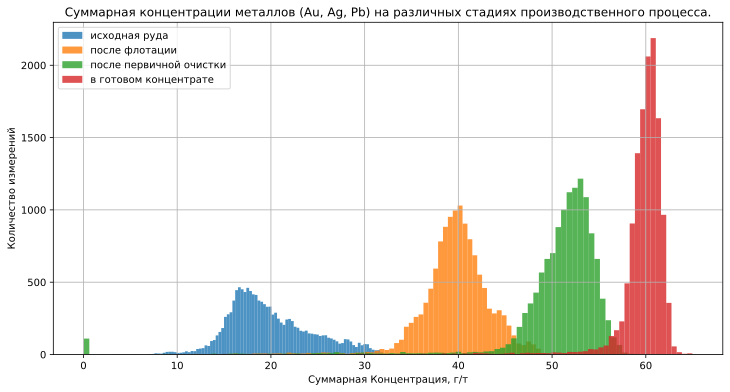

In [39]:
procedure = [
    'rougher.input.feed_',
    'rougher.output.concentrate_',
    'primary_cleaner.output.concentrate_',
    'final.output.concentrate_',
]
metals = ['au', 'ag', 'pb']

plt.figure(figsize=(12, 6))
plt.grid(True)
plt.xlabel('Суммарная Концентрация, г/т')
plt.ylabel('Количество измерений')
plt.title(f'Суммарная концентрации металлов (Au, Ag, Pb) на различных стадиях производственного процесса.')
for proc in procedure:

    df = data['train'][f'{proc}au'] + data['train'][f'{proc}ag'] + data['train'][f'{proc}pb']     

#df = data['train'][f'{proc}{metal}']
    plt.hist(df, bins=100, alpha=0.8)
    plt.legend(['исходная руда', 'после флотации', 
                'после первичной очистки', 'в готовом концентрате'])

Отмечаем:
1. Суммарная концентрация всех трех металлов увеличивается с каждым этапом техпроцесса.
2. Очистка металлов проводится успешно.


### 3.5. Изменение эффективности обогащения на разных стадиях производственного процесса.

Рассмотрим:
* эффективность обогащения 'recovery' на стадии флотации 'rougher.output.recovery'
* эффективность обогащения 'recovery' на стадии очистки 'final.output.recovery'

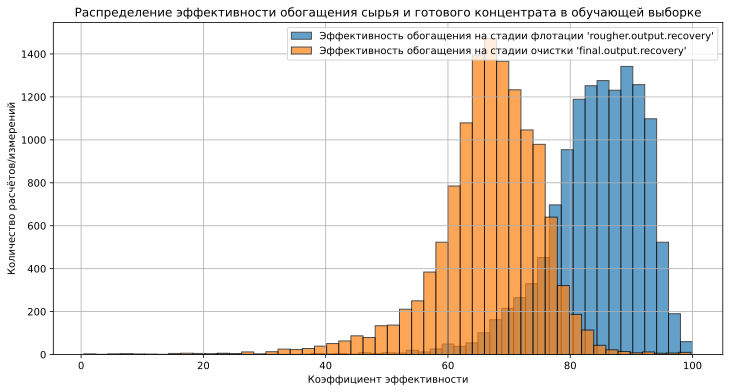

In [40]:
# Посмотрим распределение целевых признаков 'rougher.output.recovery' и 'final.output.recovery' 
# в обучающей выборке (датасет gold_recovery_train_new):
data['train']['rougher.output.recovery'].hist(figsize=(12, 6), bins=50, alpha=0.7, edgecolor = 'black')

data['train']['final.output.recovery'].hist(figsize=(12, 6), bins=50, alpha=0.7, edgecolor = 'black')
plt.grid(True)
plt.legend(["Эффективность обогащения на стадии флотации 'rougher.output.recovery'", 
            "Эффективность обогащения на стадии очистки 'final.output.recovery'"])
plt.xlabel('Коэффициент эффективности')
plt.ylabel('Количество расчётов/измерений')
plt.title('Распределение эффективности обогащения сырья и готового концентрата в обучающей выборке')
plt.show()

Отмечаем:
1. Количество расчётов эффективности обогащения на обеих стадиях производственного процесса соответствует друг другу.
2. Коэффициент эффективности обогащения на первой стадии (флотация) больше такого же коэффициента на стадии финальной очистки. Видимо, процесс флотации эффективнее, чем последующая очистка.

### 3.6. Проверка количества сокращённых объектов и их доли в общем числе исходных объектов

In [41]:
for key_df in ['train', 'test']:
    print("\nДатасет data '", key_df)
    print(f'Начальное количество объектов: {initial_size[key_df]:_.0f}')
    print(f'Количество объектов после всех преобразований: {data[key_df].shape[0]:_.0f}')
    print(f'Сокращено : {initial_size[key_df] - data[key_df].shape[0]:.0f} объектов,',
          f'что составляет: {(initial_size[key_df] - data[key_df].shape[0]) / initial_size[key_df]:.2%}'
          )


Датасет data ' train
Начальное количество объектов: 14_149
Количество объектов после всех преобразований: 12_848
Сокращено : 1301 объектов, что составляет: 9.19%

Датасет data ' test
Начальное количество объектов: 5_290
Количество объектов после всех преобразований: 5_290
Сокращено : 0 объектов, что составляет: 0.00%


Сокращение выборки составляет несколько процентов. Это допустимо.

### 3.7. Промежуточные выводы:

1.Подготовлена программа по расчету межквартильного диапазона (‘iqr_outlier’)

2.Проведён анализ изменения концентрации металлов (Au, Ag, Pb) на различных этапах очистки.

Установлено:
* Концентрация золота повышается с каждым этапом. Цель производства - повысить концентрацию золота является достижимой. Содержание Au в результате повышается в 7-8 раз.
* Концентрация серебра понижается с каждым шагом очистки. Судя по всему, основная цель предприятия - добыча золота и хозяева готовы мириться с потерей сопутствующего серебра. Хотя это и довольно расточительно. В готовом концентрате содержание Ag около 5 грамм/тонну. В исходной руде серебра было около 7.5 г/т. Таким образом, потери составили около 2.5 г/т. При среднем для такого рода предприятий значения объёма добытой руды в 1 млн тонн, компания теряет около 2,5 тонны серебра в год. Что при нынешних ценах на серебро в 66.5 руб за грамм: https://investfunds.ru/indexes/225/?ysclid=lgux43pt30329660739 может стоить около 160 млн рублей. А если компания вообще не извлекает серебро, то упущенная выгода оценивается в 0.5 млрд рублей ежегодно.
* Концентрация свинца повышается с 2.5 г/т в исходном сырье до примерно 10 г/т в готовом концентрате.
* К сожалению, нет информации по содержанию Cu. А это - основа золотосодержащей руды.
* Нулевые значения (они могут возникнуть только при отсутствии аналитического сигнала) мы убрали. Остальные отклонения от нормального распределения трогать не будем. Совсем уж аномальных (в десятки раз) значений не наблюдаем.

3.Проведено сравнение распределений размеров гранул сырья на обучающей и тестовой выборках.
* Существует слабая (0.22 - 0.26) корреляция между значениями размера гранул и целевыми признаками в обучающей выборке.
* Связь между значениями размера гранул и целевыми признаками в тестовой выборке отсутствует.
* Отмечено, ‘До’ флотации проведено примерно в 2 раза больше замеров, нежели ‘После’ флотации.
* Распределения в обучающей и тестовой выборках очень похожи. Нормальное распределение имеет смещение в область более крупных размеров.
* В руде ‘ДО’ флотации отмечается много выбросов после размера гранул 100, вплоть до 500.
* Размер гранул руде ‘ПОСЛЕ’ флотации сильно (в 7-8 раз) уменьшился по сравнению с размером гранул 'До' флотации.
	
4.Проведён анализ изменения концентрации металлов (Au, Ag, Pb) в 'хвостах' на разных этапах техпроцесса.

* по золоту:
    - в 'хвосты' для последующей утилизации попадает материал с довольно большими содержаниями золота. Вплоть до 25 г/т! Рекомендуем технологам обратить внимание на такие серьезные потери золота в ходе технологического процесса.
    - на обеих стадиях очистки утилизируется материал с бОльшими концентрациями по золоту, чем на стадии флотации. Понятно, что на очистку после флотации попадает более 'богатый' материал. Но и потери тут более значимые.
* по серебру:
    - Материалы, 'богатые' серебром, также, как и золото, теряются на стадиях очистки.
    - Утилизируется руда с концентрациями серебра вплоть до 30 г/т.
    - Как уже отмечалось ранее, на производстве уделяется недостаточное внимание на добычу серебра. И в отходы отправляется руда с промышленными содержаниями по серебру.
* по свинцу:
    - Свинец тоже теряется на стадиях очистки.
    - При флотации наблюдаются потери материалов с малым содержанием по свинцу.
* Потери материалов с крупными содержаниями всех металлов идут в основном на стадиях очистки.
* Признаки с информацией о содержании элементов в 'хвостах' были очищены от нулевых значений.

5.Проведено исследование суммарной концентрации всех металлов (Au, Ag, Pb) на разных стадиях: в сырье, в черновом и финальном концентратах

Отмечено:
* Суммарная концентрация всех трех металлов увеличивается с каждым этапом техпроцесса.
* Очистка металлов проводится успешно.

6.Изучено изменение эффективности обогащения на разных стадиях производственного процесса.

Установлено:
* Количество расчётов эффективности обогащения на обеих стадиях производственного процесса соответствует друг другу.
* Коэффициент эффективности обогащения на первой стадии (флотация) больше такого же коэффициента на стадии финальной очистки. Видимо, процесс флотации эффективнее, чем последующая очистка.

7.Выполнена проверка количества сокращённых объектов и их доли в общем числе исходных объектов

8.Установлено, что сокращение выборки составляет несколько процентов. Это допустимо.


## 4. Модель

Задачи:

1. Написать функцию для вычисления итоговой sMAPE.

2. Обучить разные модели и оценить их качество кросс-валидацией. Выбрать лучшую модель и проверить её на тестовой выборке. Описать выводы.

### 4.1. Функции расчета метрик качества.

Формулы для расчета метрик качества:

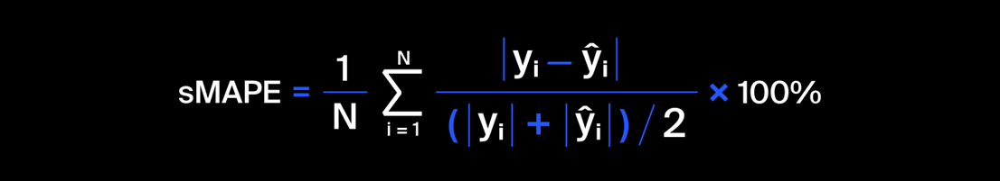

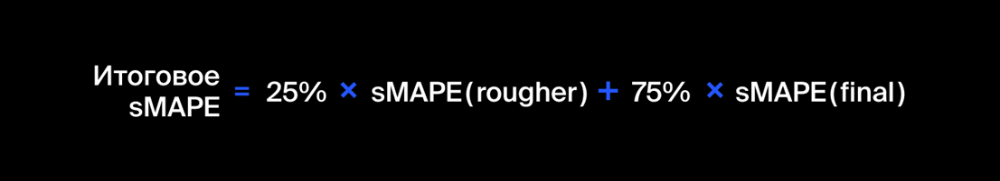

In [42]:
def smape_func(y_target, y_predict):
    difference = np.abs(y_target - y_predict)
    sum_ma = (np.abs(y_target) + np.abs(y_predict)) / 2
    return np.mean(difference / sum_ma) * 100

def final_smape_func(rougher, final):
    return 0.25 * rougher + 0.75 * final

smape_scorer = make_scorer(smape_func, greater_is_better=False)

### 4.2. Создание обучающей и тестовой выборок

In [43]:
# Создадим список колонок для обучающей (features) и тестовой () выборок:
#features_col = data['test'].columns[1:-2] - через индексы

# Создадим features не через индексы, а через названия колонок:
features_col = data['test'].columns.tolist()
features_col.remove('date')
features_col.remove('rougher.output.recovery')
features_col.remove('final.output.recovery')

targets_col = ["rougher.output.recovery","final.output.recovery"]

# Создадим тестовую выборку:
features_test = data['test'][features_col].reset_index(drop=True)
target_test = data['test'][targets_col].reset_index(drop=True)

print(features_test.shape, target_test.shape)

# Создадим обучающую выборку:
features_train = data['train'][features_col].reset_index(drop=True)
target_train = data['train'][targets_col].reset_index(drop=True)

print(features_train.shape, target_train.shape)

(5290, 52) (5290, 2)
(12848, 52) (12848, 2)


### 4.3. Создание и обучение моделей. 

Исследование проведем на следующих моделях:
* 'Дерево решений'.
* 'Cлучайного леса'.
* 'Линейной регрессии'.

#### 4.3.1. Модель 'Дерево решений' c подбором параметра глубины

In [44]:
%%time

model_dtree_rougher = DecisionTreeRegressor(random_state=RANDOM_FIX_NUMBER)

#params = {'max_depth':range(1,30)} 
# Наилучшее значение 'max_depth' = 3. Поэтому можно ускорить работу GridSearchCV:
params = {'max_depth':range(3,4)}

grid_dt_rougher = GridSearchCV(model_dtree_rougher, params, cv=5, scoring=smape_scorer, verbose=1)                    
grid_dt_rougher.fit(features_train, target_train['rougher.output.recovery'])

print('Для таргета "rougher.output.recovery":')
print('Наилучшая модель "Дерево решений" c оценкой качества кросс-валидацией:', grid_dt_rougher)
print('Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV:', 
      grid_dt_rougher.best_params_)
print('Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV": ', 
      round(abs(grid_dt_rougher.best_score_), 3))
Separating_line()


model_dtree_final  = DecisionTreeRegressor(random_state=RANDOM_FIX_NUMBER)

# params = {'max_depth':range(1,30)} 
# Наилучшее значение 'max_depth' = 2. Поэтому можно ускорить работу GridSearchCV:
params = {'max_depth':range(2,3)}

grid_dt_final = GridSearchCV(model_dtree_final, params, cv=5, scoring=smape_scorer, verbose=1)                    
grid_dt_final.fit(features_train, target_train['final.output.recovery'])

print('Для таргета "final.output.recovery":')
print('Наилучшая модель "Дерево решений" c оценкой качества кросс-валидацией:', grid_dt_final)
print('Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV:', 
      grid_dt_final.best_params_)
print('Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV": ', 
      round(abs(grid_dt_final.best_score_), 3))
Separating_line()


print('Итоговое sMAPE наилучшей модели "Дерево решений" c GridSearchCV": ', 
      round(final_smape_func(abs(grid_dt_rougher.best_score_), abs(grid_dt_final.best_score_)), 3))
Separating_line()

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Для таргета "rougher.output.recovery":
Наилучшая модель "Дерево решений" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=12345),
             param_grid={'max_depth': range(3, 4)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV: {'max_depth': 3}
Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  7.102
--------------------------------------------------------------------------------
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Для таргета "final.output.recovery":
Наилучшая модель "Дерево решений" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=12345),
             param_grid={'max_depth': range(2, 3)},
             scoring=make_scorer(smape_func, greater_is_better=False),

**Для экономии времени на вычисления, привожу свои результаты:**
    
Fitting 5 folds for each of 4 candidates, totalling 20 fits
* Для таргета "rougher.output.recovery":
    * Наилучшая модель "Дерево решений" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=12345),
             param_grid={'max_depth': range(1, 5)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
    * Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV: {'max_depth': 3}
    * Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  7.102

Fitting 5 folds for each of 4 candidates, totalling 20 fits
* я таргета "final.output.recovery":
    * Наилучшая модель "Дерево решений" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=12345),
             param_grid={'max_depth': range(1, 5)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
    * Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV: {'max_depth': 2}
    * Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  9.151

* Итоговое sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  8.638

CPU times: total: 4.97 s
Wall time: 4.96 s

#### 4.3.2. Модель 'Cлучайного леса' c подбором параметров

In [45]:
%%time

# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model_rf_rougher = RandomForestRegressor(random_state=RANDOM_FIX_NUMBER)
    parameters = { 'max_depth': range(5,6),
                   'n_estimators': range(41, 42) }

    grid_rf_rougher = GridSearchCV(model_rf_rougher, parameters, cv=5, scoring=smape_scorer, verbose=1)   
    grid_rf_rougher.fit(features_train, target_train['rougher.output.recovery'])

    print('Для таргета "rougher.output.recovery":')
    print('Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией:', grid_rf_rougher)
    print('Лучшие параметры:', grid_rf_rougher.best_params_)
    print('smape_rougher', abs(round(grid_rf_rougher.best_score_, 3)))
    Separating_line()
    

for _ in tqdm(range(1)):
    model_rf_final = RandomForestRegressor(random_state=RANDOM_FIX_NUMBER)
    parameters = { 'max_depth': range(2,3),
                   'n_estimators': range(268, 269) }

    grid_rf_final = GridSearchCV(model_rf_final, parameters, cv=5, scoring=smape_scorer, verbose=1)   
    grid_rf_final.fit(features_train, target_train['final.output.recovery'])

    print('Для таргета "final.output.recovery":')
    print('Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией:', grid_rf_final)
    print('Лучшие параметры:', grid_rf_final.best_params_)
    print('smape_rougher', abs(round(grid_rf_final.best_score_, 3)))
    Separating_line()
    
    
print('Итоговое sMAPE наилучшей модели "Дерево решений" c GridSearchCV": ', 
      round(final_smape_func(abs(grid_rf_rougher.best_score_), abs(grid_rf_final.best_score_)), 3))
Separating_line()

  0%|          | 0/1 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Для таргета "rougher.output.recovery":
Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=12345),
             param_grid={'max_depth': range(5, 6),
                         'n_estimators': range(41, 42)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
Лучшие параметры: {'max_depth': 5, 'n_estimators': 41}
smape_rougher 6.324
--------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Для таргета "final.output.recovery":
Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=12345),
             param_grid={'max_depth': range(2, 3),
                         'n_estimators': range(268, 269)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
Лучшие параметры: {'max_depth': 2, 'n_estimators': 268}
smape_rougher 9.02
--------------------------------------------------------------------------------
Итоговое sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  8.346
--------------------------------------------------------------------------------
CPU times: total: 2min 8s
Wall time: 2min 8s


**Для экономии времени на вычисления, привожу свои результаты:**

**1. Результаты расчета по модели 'Случайный лес' c 
  param_grid={'max_depth': range(1, 10), 'n_estimators': range(1, 300, 10)}**

Для таргета "rougher.output.recovery":
* Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией: GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=12345),
             param_grid={'max_depth': range(1, 10),
                         'n_estimators': range(1, 300, 10)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
* Лучшие параметры: {'max_depth': 5, 'n_estimators': 41}
  smape_rougher 7.455

Для таргета "final.output.recovery":
* Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией: GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=12345),
             param_grid={'max_depth': range(1, 10),
                         'n_estimators': range(1, 300, 10)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
* Лучшие параметры: {'max_depth': 2, 'n_estimators': 291}
  smape_rougher 9.41

Итоговое sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  8.921

CPU times: total: 6h 23min 44s
Wall time: 6h 23min 51s

**2. Результаты расчета по модели 'Случайный лес' c 
  param_grid={'max_depth': range(5, 6), 'n_estimators': range(35, 45)}**

Для таргета "rougher.output.recovery":
* Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=12345),
             param_grid={'max_depth': range(5, 6),
                         'n_estimators': range(35, 45)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
* Лучшие параметры: {'max_depth': 5, 'n_estimators': 41}

    smape_rougher 6.324

Для таргета "final.output.recovery":
* Наилучшая модель "Cлучайного леса" c оценкой качества кросс-валидацией: GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=12345),
             param_grid={'max_depth': range(2, 3),
                         'n_estimators': range(260, 300)},
             scoring=make_scorer(smape_func, greater_is_better=False),
             verbose=1)
* Лучшие параметры: {'max_depth': 2, 'n_estimators': 268}

    smape_rougher 9.02

Итоговое sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  8.346

CPU times: total: 50min 26s
Wall time: 50min 28s

#### 4.3.3. Модель 'Линейной регрессии' 

In [46]:

for _ in tqdm(range(1)):
    model_line_reg_rougher = LinearRegression()
    scores_line_reg_rougher = cross_val_score(model_line_reg_rougher,  
                                              features_train, 
                                              target_train['rougher.output.recovery'], 
                                              scoring = smape_scorer,
                                              cv = 5)
    smape_rougher = np.mean(abs(scores_line_reg_rougher))
    print('Средняя оценка качества sMape_rougher', round(smape_rougher, 4))
    Separating_line()

for _ in tqdm(range(1)):    
    model_line_reg_final = LinearRegression()
    scores_line_reg_final = cross_val_score(model_line_reg_final,  
                                              features_train, 
                                              target_train['final.output.recovery'], 
                                              scoring = smape_scorer,
                                              cv = 5)
    smape_final = np.mean(abs(scores_line_reg_final))
    print('Средняя оценка качества sMape_final', round(smape_final, 4))
    Separating_line()
    
print('Итоговое sMAPE наилучшей модели "Линейная регрессия" c GridSearchCV": ', 
      round(final_smape_func(abs(smape_rougher), abs(smape_final)), 3))
Separating_line()

  0%|          | 0/1 [00:00<?, ?it/s]

Средняя оценка качества sMape_rougher 7.4825
--------------------------------------------------------------------------------


  0%|          | 0/1 [00:00<?, ?it/s]

Средняя оценка качества sMape_final 11.0976
--------------------------------------------------------------------------------
Итоговое sMAPE наилучшей модели "Линейная регрессия" c GridSearchCV":  10.194
--------------------------------------------------------------------------------


**Для экономии времени на вычисления, привожу свои результаты:**
    
* Средняя оценка качества sMape_rougher 7.4825

* Средняя оценка качества sMape_final 11.0976

* Итоговое sMAPE наилучшей модели "Линейная регрессия" c GridSearchCV":  10.194

### 4.4. Создание и обучение моделей на базе Pipeline.

In [57]:
%%time
from imblearn.pipeline import make_pipeline as make_imblearn_pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform


estimators_range = uniform(230,260).rvs(10000, random_state=RANDOM_FIX_NUMBER).astype(int)
max_depth_range = uniform(5,7).rvs(10000, random_state=RANDOM_FIX_NUMBER).astype(int)

pipeline = make_imblearn_pipeline(RandomForestClassifier())
pipeline.steps[-1] = ('clf', pipeline.steps[-1][1])

param_grid = [
    {
        'clf': [DecisionTreeRegressor(random_state=RANDOM_FIX_NUMBER)],
        'clf__max_depth': max_depth_range
    },

    {
        'clf': [RandomForestRegressor(random_state=RANDOM_FIX_NUMBER)],
        'clf__n_estimators': estimators_range,
        'clf__max_depth': max_depth_range,
    },    

    {   'linearregression': [LinearRegression()],
        'columntransformer__pipeline__standardscaler': [MinMaxScaler(),
                                                    StandardScaler()],
    }
]

grid_search = RandomizedSearchCV(pipeline,  
                                 param_grid, 
                                 n_iter=30,
                                 cv=5, 
                                 scoring = smape_scorer,
                                 random_state=RANDOM_FIX_NUMBER,
                                )

grid_search.fit(features_train, target_train['rougher.output.recovery'])

print('\nДля таргета "rougher.output.recovery":')
Separating_line()
print('best_params :', grid_search.best_params_)
Separating_line()
print('best_score :', grid_search.best_score_)
Separating_line()
smape_rougher = abs(grid_search.best_score_)
print('Средняя оценка качества sMape_rougher', round(smape_rougher, 4))
#print('cv_results :', grid_search.cv_results_)

grid_search.fit(features_train, target_train['final.output.recovery'])

print('\nДля таргета "final.output.recovery":')
Separating_line()
print('best_params :', grid_search.best_params_)
Separating_line()
print('best_score :', grid_search.best_score_)
Separating_line()
smape_final = abs(grid_search.best_score_)
print('Средняя оценка качества sMape_final', round(smape_final, 4))
#print('cv_results :', grid_search.cv_results_)

print('\nИтоговое sMAPE наилучшей модели "Pipeline" c GridSearchCV": ', 
      round(final_smape_func(abs(smape_rougher), abs(smape_final)), 3))
Separating_line()


Для таргета "rougher.output.recovery":
--------------------------------------------------------------------------------
best_params : {'clf__n_estimators': 236, 'clf__max_depth': 6, 'clf': RandomForestRegressor(max_depth=6, n_estimators=236, random_state=12345)}
--------------------------------------------------------------------------------
best_score : -6.258859141066537
--------------------------------------------------------------------------------
Средняя оценка качества sMape_rougher 6.2589

Для таргета "final.output.recovery":
--------------------------------------------------------------------------------
best_params : {'clf__n_estimators': 257, 'clf__max_depth': 5, 'clf': RandomForestRegressor(max_depth=5, n_estimators=257, random_state=12345)}
--------------------------------------------------------------------------------
best_score : -9.004802301532887
--------------------------------------------------------------------------------
Средняя оценка качества sMape_final 9.004

**Для экономии времени на вычисления, привожу свои результаты:**

1.Для таргета "rougher.output.recovery":
* best_params : {'clf__n_estimators': 236, 'clf__max_depth': 6, 'clf': RandomForestRegressor(max_depth=6, n_estimators=236, random_state=12345)}
* best_score : -6.258859141066537
* Средняя оценка качества sMape_rougher 6.2589


2.Для таргета "final.output.recovery":
* best_params : {'clf__n_estimators': 257, 'clf__max_depth': 5, 'clf': RandomForestRegressor(max_depth=5, n_estimators=257, random_state=12345)}
* best_score : -9.004802301532887
* Средняя оценка качества sMape_final 9.0048


Итоговое sMAPE наилучшей модели "Pipeline" c "RandomizedSearchCV":  8.318


CPU times: total: 1h 25min 6s
Wall time: 1h 25min 9s

Отмечаем:

1.Для лучшей модели, рассчитанной Pipeline, значение метрики 'Итоговое_sMAPE' c "RandomizedSearchCV" равно 8.318, что чуть лучше значения этой метрики для наилучшей модели "Дерево решений" c GridSearchCV": 8.346.

2.Наилучшими являются следующие модели:
* для таргета "rougher.output.recovery": RandomForestRegressor(max_depth=6, n_estimators=236, random_state=12345).
* для таргета "final.output.recovery": RandomForestRegressor(max_depth=5, n_estimators=257, random_state=12345)

### 4.5. Проверка лучшей модели на тестовой выборке.

In [53]:
# Расчет по модели 'Случайный лес'
predictions_r = grid_rf_rougher.predict(features_test) 
predictions_f = grid_rf_final.predict(features_test) 

print('Итоговое sMAPE на тестовой выборке по модели "Случайный лес":')
round(final_smape_func(smape_func(target_test['rougher.output.recovery'], predictions_r), 
                 smape_func(target_test['final.output.recovery'], predictions_f)), 3)

#  8.948

Итоговое sMAPE на тестовой выборке по модели "Случайный лес":


8.948

In [54]:
# Расчет по модели 'Дерево решений'
predictions_dtree_r = grid_dt_rougher.predict(features_test) 
predictions_dtree_f = grid_dt_final.predict(features_test) 

print('Итоговое sMAPE на тестовой выборке по модели "Дерево решений" (для самопроверки):')
round(final_smape_func(smape_func(target_test['rougher.output.recovery'], predictions_dtree_r), 
                 smape_func(target_test['final.output.recovery'], predictions_dtree_f)), 3)

# 9.626

Итоговое sMAPE на тестовой выборке по модели "Дерево решений" (для самопроверки):


9.626

Лучшая модель 'Случайный лес' и есть лучшая!

### 4.6. Проверка на константной модели.

In [55]:
model_dum_recovery = DummyRegressor(strategy="median")
model_dum_recovery.fit(features_train, target_train['rougher.output.recovery'])
predictions_recovery = model_dum_recovery.predict(features_test) 

model_dum_final = DummyRegressor(strategy="median")
model_dum_final.fit(features_train, target_train['final.output.recovery'])
predictions_final = model_dum_final.predict(features_test) 

#final_smape_func(smape_func(target_test['rougher.output.recovery'], predictions_recovery), 
#                 smape_func(target_test['final.output.recovery'], predictions_final))

print('Итоговое sMAPE на константной модели:')
round(final_smape_func(smape_func(target_test['rougher.output.recovery'], predictions_recovery), 
                 smape_func(target_test['final.output.recovery'], predictions_final)), 3)

# 9.486

Итоговое sMAPE на константной модели:


9.486

**Проверка модели на адекватность:**

Ошибка на тестовой выборке разумная. Она меньше, чем на константной модели.

### 4.7. Промежуточные выводы:

#### 1.Построены функции для расчёта метрик качества: sMAPE и Итоговое_sMAPE.

#### 2.Созданы обучающая и тестовая выборки.

#### 3.Созданы и обучены модели:

*   **Модель 'Дерево решений' c подбором параметра глубины**.

  Для таргета "rougher.output.recovery":
  
    * Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV: {'max_depth': 3}
    * Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV": 7.102
  
  Для таргета "final.output.recovery":
  
    * Глубина дерева наилучшей модели "Дерево решений" с GridSearchCV: {'max_depth': 2}
    * Метрика оценки качества sMAPE наилучшей модели "Дерево решений" c GridSearchCV": 9.151
    
  *Итоговое_sMAPE наилучшей модели "Дерево решений" c GridSearchCV":  8.638.*


*    **Модель 'Cлучайного леса' c подбором параметров**.

  Для таргета "rougher.output.recovery":

     * Лучшие параметры: {'max_depth': 5, 'n_estimators': 41}
     * smape_rougher 6.324
  
  Для таргета "final.output.recovery":
  
     * Лучшие параметры: {'max_depth': 2, 'n_estimators': 268}
     * smape_final 9.02
    
  *Итоговое sMAPE наилучшей модели "Cлучайного леса" c GridSearchCV": 8.346.*
  

*    **Модель 'Линейной регрессии'**.

     * Средняя оценка качества sMape для таргета "rougher.output.recovery": 7.483.
     * Средняя оценка качества sMape для таргета "final.output.recovery": 11.098.
    
  *Итоговое_sMAPE наилучшей модели "Линейная регрессия" c GridSearchCV":  10.194.*


*    **Модель 'Pipeline'**.
     
  Для лучшей модели, рассчитанной Pipeline, значение метрики 'Итоговое_sMAPE' c "RandomizedSearchCV" равно 8.318, что чуть лучше значения этой метрики для наилучшей модели "Дерево решений" c GridSearchCV": 8.346.
     
  Для таргета "rougher.output.recovery":
  
      * RandomForestRegressor(max_depth=6, n_estimators=236, random_state=12345).
      * smape_rougher 6.259       
  Для таргета "final.output.recovery": 
  
      * RandomForestRegressor(max_depth=5, n_estimators=257, random_state=12345)
      * smape_rougher 9.005
  *Итоговое_sMAPE наилучшей модели "Pipeline" c RandomizedSearchCV": 8.318.* 

#### 4.Проведена проверка лучшей модели на тестовой выборке.

  *Итоговое_sMAPE: 8.948.*


#### 5.Выполнена проверка модели на адекватность.

  *Итоговое_sMAPE: 9.486.*
  
  Ошибка на тестовой выборке меньше, чем на константной модели. Модель - адекватная.

## 5. Чек-лист готовности проекта

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке выполнения
- [x]  Выполнен шаг 1: данные подготовлены
    - [x]  Проверена формула вычисления эффективности обогащения
    - [x]  Проанализированы признаки, недоступные в тестовой выборке
    - [x]  Проведена предобработка данных
- [x]  Выполнен шаг 2: данные проанализированы
    - [x]  Исследовано изменение концентрации элементов на каждом этапе
    - [x]  Проанализированы распределения размеров гранул на обучающей и тестовой выборках
    - [x]  Исследованы суммарные концентрации
- [x]  Выполнен шаг 3: построена модель прогнозирования
    - [x]  Написана функция для вычисления итогового *sMAPE*
    - [x]  Обучено и проверено несколько моделей
    - [x]  Выбрана лучшая модель, её качество проверено на тестовой выборке

## 6. Общий вывод

**По результатам исследования можно отметить следующие факты и сделать следующие выводы:**
  
1.От компании «Цифра» получены данные с контрольными измерениями по ходу технологического процесса:
    * концентраций Au, Ag, Pb от исходного сырья до конечного концентрата,
    * информация по составу и количеству флотационных реагентов,
    * другим производственным характеристикам.

2.Данные подготовлены для дальнейшего анализа.

3.Проверена и подтверждена правильность расчёта эффективности обогащения.

4.Изучено распределение пропущенных значений по времени:
* Количество пропущенных значений удваиваивается с каждым годом.
* По результатам наблюдений в 2016-2018 годах установлено очень неровное количество пропущенных значений по месяцам. В четыре месяца (январь, октябрь, ноябрь и декабрь) пропущенных значений нет совсем. А больше всего их в апреле и августе.
* В последнюю неделю каждого месяца количество пропущенных значений минимально.
* Из максимального количества в 1605 пропусков признака "secondary_cleaner.output.tail_sol" сразу 1354 приходится на апрель-август 2018 года.

5.Исследована динамика изменения содержаний металлов (Au, Ag, Pb) в рудных материалах на всех стадиях производственного процесса. Отмечено:
    * Концентрации Au и Pb увеличиваются.
    * Серебро теряется. Видимо на предприятии нет задачи по выделению серебра из руды. Упущенная выгода при этом оценена в 0.5 млрд рублей ежегодно.

6.Изучено такая характеристика, как размер гранул рудных материалов ‘До’ и ‘После’ процесса флотации. В среднем их размер уменьшается в 10 раз.

7.Исследована динамика изменения содержаний металлов (Au, Ag, Pb) в так называемых ‘хвостах’. т.е. отходах. Отмечено, что в отходы попадают материалы с очень большими содержаниями и золота, и серебра. Это информация для технологов.

8.По динамике суммарного содержания всех металлов на разных стадиях очистки и концентрирования металлов можно говорить о том, что суммарная концентрация всех трех металлов увеличивается с каждым этапом техпроцесса, а следовательно, очистка металлов проводится успешно.

9.По распределению эффективности обогащения сырья и готового концентрата сделано заключение, что процесс флотации эффективнее, чем последующая очистка.

10.Созданы функции для расчёта метрик: sMAPE и Итоговое_sMAPE.

11.Собраны обучающая и тестовая выборки для построения моделей.

12.Построена модель 'Дерево решений' c подбором параметра глубины дерева. Итоговое_sMAPE наилучшей модели "Дерево решений" c GridSearchCV" равно 8.638.

13.Создана модель 'Cлучайного леса' c автоматическим подбором параметров глубина дерева и количество деревьев. Итоговое_sMAPE наилучшей модели 'Cлучайного леса' c GridSearchCV" равно 8.346.

14.Построена модель 'Линейной регрессии'. Итоговое_sMAPE равно 10.194.

15.Методом Pipeline построена и рассчитана лучшая модель, c автоматическим подбором параметров глубина дерева и количество деревьев. Итоговое_sMAPE наилучшей модели "Pipeline" c RandomizedSearchCV": 8.318.

16.В качестве лучшей выбрана модель 'Cлучайного леса, рассчитанная Pipeline. ‘Итоговое_sMAPE’ = 8.318

17.Лучшая модель проверена на тестовой выборке. ‘Итоговое_sMAPE’ = 8.948.

18.Проведена проверка модели на адекватность. ‘Итоговое_sMAPE’ = 9.486, что больше, чем на тестовой выборке. Ошибка на тестовой выборке разумная.

[Вернутся к общему списку проектов курса “Data Science” Яндекс-практикума](../README.md)